<a href="https://www.kaggle.com/code/dataranch/cell-phone-dataset-xgboost-fastai?scriptVersionId=111021758" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Cell Phone Stats Model Comparison + Feature Importance 📊**</div>
- Preprocessing
    - Detect continuous and categorical variables.
    - Normalize and impute data.
    

- For every target variable in the dataset:
    - Compare performance on 27 models + a TabNet model.
    - Output model performance and processed data in CSV format for every dataset.
    - Save plots + CSVs of XGBoost Feature Importances.
    - Save best performing FastAI model.

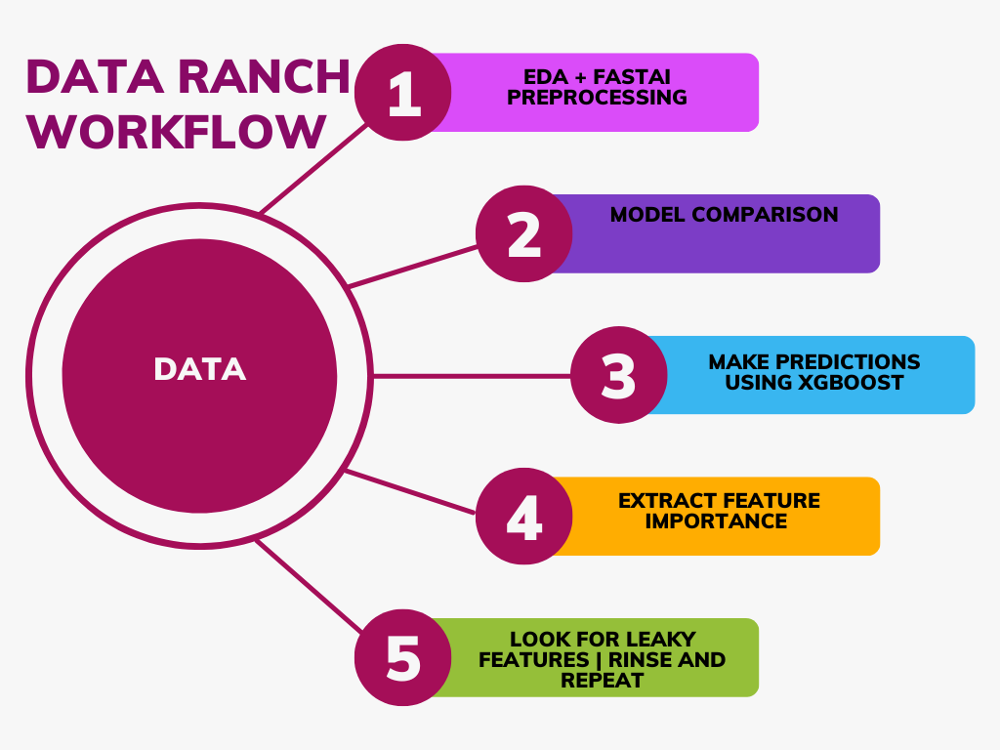

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install lazypredict

In [3]:
!pip install --upgrade pandas

In [4]:
!pip install fast-tabnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.3 MB/s eta 0:00:00


In [5]:
!pip install fastai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.4.0
    Uninstalling typing_extensions-4.4.0:
      Successfully uninstalled typing_extensions-4.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0 which is incompatible.
tensorflow 2.6.4 requires numpy~=1.19.2, but you have numpy 1.21.6 which is incompatible.
tensorflow 2.6.4 requires tensorboard<2.7,>=2.6.0, but you have tensorboard 2.10.1 which is incompatible.
tensorflow 2.6.4 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.1.1 which is incompatible.
tensorflow-transform 1.9.0 requires pyarrow<6,>=1, but you have pyarrow 8.0.0 which is incompatible.
tensorflow-transform 1.9.0 requires te

In [6]:
!pip install pandas-profiling

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
werkzeug 2.2.2 requires MarkupSafe>=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [7]:
#A program that takes a csv and trains models on it. Streamlined model selection.
#==============================================================================

#LazyPredict
import lazypredict
from lazypredict.Supervised import LazyRegressor
from lazypredict.Supervised import LazyClassifier
#Baysian Optimization
from bayes_opt import BayesianOptimization
#Pandas stack
import pandas as pd
import pandas_profiling
import numpy as np
#FastAI
from fastai.tabular.all import *
from fastai.tabular.core import *
#Plots
import matplotlib.pyplot as plt
import seaborn as sns
#System
import os
import sys
import traceback
#Fit an xgboost model
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
#Random
import random

#TabNet
from fast_tabnet.core import *

import shutil

In [8]:
%matplotlib inline

In [9]:
# For Styling
plt.style.use('seaborn-bright')

In [10]:
#Project Variables
#===================================================================================================
PROJECT_NAME = 'cellphones-recommendations'
VARIABLE_FILES = False
#Maximum amount of rows to take
SAMPLE_COUNT = 4000
FASTAI_LEARNING_RATE = 1e-1
AUTO_ADJUST_LEARNING_RATE = False
#Set to True automatically infer if variables are categorical or continuous
ENABLE_BREAKPOINT = True
#When trying to declare a column a continuous variable, if it fails, convert it to a categorical variable
CONVERT_TO_CAT = False
REGRESSOR = True
SEP_DOLLAR = False
SEP_COMMA = False
SHUFFLE_DATA = True

In [11]:
input_dir = f'../input/{PROJECT_NAME}'
param_dir = f'/kaggle/working/{PROJECT_NAME}'
TARGET = ''
PARAM_DIR = param_dir
print(f'param_dir: {param_dir}')
if not os.path.exists(param_dir):
    os.makedirs(param_dir)


param_dir: /kaggle/working/cellphones-recommendations


# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Merge Data**</div>

In [12]:
#Read and merge dfs
cellphone_df = pd.read_csv('../input/cellphones-recommendations/cellphones data.csv')
rating_df  = pd.read_csv('../input/cellphones-recommendations/cellphones ratings.csv')
user_df = pd.read_csv('../input/cellphones-recommendations/cellphones users.csv')
#merge rating df and cellphone_df on cellphone_id
df = pd.merge(rating_df, cellphone_df, on='cellphone_id')
#merge rating_df and user_df on user_id
df = pd.merge(df, user_df, on='user_id')

In [13]:
df

,user_id,cellphone_id,rating,brand,model,operating system,internal memory,RAM,performance,main camera,selfie camera,battery size,screen size,weight,price,release date,age,gender,occupation
0,0,30,1,Motorola,Moto G Play (2021),Android,32,3,1.42,13,5,5000,6.50,204,159,14/01/2021,38,Female,Data analyst
1,0,5,3,Apple,iPhone XR,iOS,64,3,4.22,12,7,2942,6.10,194,236,26/10/2018,38,Female,Data analyst
2,0,10,9,Samsung,Galaxy S22,Android,128,8,8.81,50,10,3700,6.10,167,528,25/02/2022,38,Female,Data analyst
3,0,9,3,Samsung,Galaxy A53,Android,128,6,3.79,64,32,5000,6.50,189,312,24/03/2022,38,Female,Data analyst
4,0,23,2,Vivo,X80 Pro,Android,256,8,9.81,50,32,4700,6.70,215,872,29/04/2022,38,Female,Data analyst
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,113,27,1,Xiaomi,Poco F4,Android,128,8,6.98,64,20,4500,6.60,195,428,27/07/2022,56,Female,retail
986,113,29,2,Motorola,Moto G Stylus (2022),Android,128,6,2.30,50,16,5000,6.80,215,500,27/04/2022,56,Female,retail
987,113,21,1,OnePlus,10T,Android,128,8,11.00,50,16,4800,6.70,204,649,06/08/2022,56,Female,retail
988,113,14,5,Samsung,Galaxy Z Fold 3,Android,256,12,6.35,12,4,4400,7.60,271,1799,11/08/2021,56,Female,retail


In [14]:
if SEP_DOLLAR:
    #For every column in df, if the column contains a $, make a new column with the value without the $
    for col in df.columns:
        if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_no_dollar'] = df[col + '_no_dollar'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')


if SEP_COMMA:
    #For every column in df, if the column contains a %, make a new column with the value without the %
    for col in df.columns:
        if '%' in df[col].to_string() or ',' in df[col].to_string():
            df[col + '_processed'] = df[col].str.replace('%', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_processed'] = df[col + '_processed'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')

In [15]:
df.isna().sum()

user_id              0
cellphone_id         0
rating               0
brand                0
model                0
operating system     0
internal memory      0
RAM                  0
performance          0
main camera          0
selfie camera        0
battery size         0
screen size          0
weight               0
price                0
release date         0
age                  0
gender               0
occupation          10
dtype: int64

In [16]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

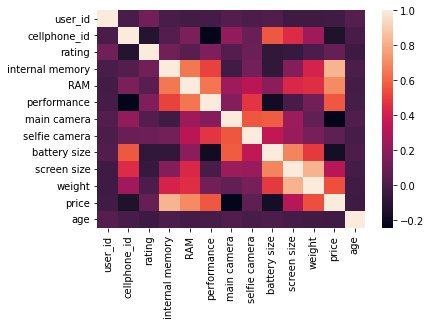

In [17]:
sns.heatmap(df.corr())

In [18]:
df.head().style.background_gradient(cmap = "inferno")

,user_id,cellphone_id,rating,brand,model,operating system,internal memory,RAM,performance,main camera,selfie camera,battery size,screen size,weight,price,release date,age,gender,occupation
0,0,30,1,Motorola,Moto G Play (2021),Android,32,3,1.42,13,5,5000,6.50,204,159,14/01/2021,38,Female,Data analyst
1,0,5,3,Apple,iPhone XR,iOS,64,3,4.22,12,7,2942,6.10,194,236,26/10/2018,38,Female,Data analyst
2,0,10,9,Samsung,Galaxy S22,Android,128,8,8.81,50,10,3700,6.10,167,528,25/02/2022,38,Female,Data analyst
3,0,9,3,Samsung,Galaxy A53,Android,128,6,3.79,64,32,5000,6.50,189,312,24/03/2022,38,Female,Data analyst
4,0,23,2,Vivo,X80 Pro,Android,256,8,9.81,50,32,4700,6.70,215,872,29/04/2022,38,Female,Data analyst


In [19]:
df.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
user_id,990.00,136.37,80.66,0.00,74.00,128.00,226.00,258.00
cellphone_id,990.00,16.42,9.47,0.00,8.00,16.00,25.00,32.00
rating,990.00,6.70,2.64,1.00,5.00,7.00,9.00,18.00
internal memory,990.00,145.03,89.31,32.00,128.00,128.00,128.00,512.00
RAM,990.00,6.70,2.67,3.00,4.00,8.00,8.00,12.00
performance,990.00,6.01,2.87,1.02,3.79,6.82,7.94,11.00
main camera,990.00,42.24,26.69,12.00,12.00,50.00,50.00,108.00
selfie camera,990.00,15.37,9.86,4.00,8.00,12.00,16.00,40.00
battery size,990.00,4376.20,763.26,2018.00,4000.00,4600.00,5000.00,5003.00
screen size,990.00,6.45,0.42,4.70,6.40,6.50,6.70,7.60


In [20]:
df.columns

Index(['user_id', 'cellphone_id', 'rating', 'brand', 'model',
       'operating system', 'internal memory', 'RAM', 'performance',
       'main camera', 'selfie camera', 'battery size', 'screen size', 'weight',
       'price', 'release date', 'age', 'gender', 'occupation'],
      dtype='object')

In [21]:
#Remove features we don't want to train or predict on
del(df['user_id'])
del(df['cellphone_id'])

Target Variable: occupation
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'gender', 'occupation']
CONTS=====================
[]
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : []
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'gender', 'occupation']
Tabular Object size: 905


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015197277069091797}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.030207395553588867}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.041966915130615234}


 10%|▉         | 4/42 [00:00<00:01, 29.80it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03960108757019043}
{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05529379844665527}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.046073198318481445}


 21%|██▏       | 9/42 [00:00<00:03,  8.81it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.5353796482086182}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.020446300506591797}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.1515800952911377}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015171051025390625}


 31%|███       | 13/42 [00:01<00:02, 11.02it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 0.22966915950329592, 'Time taken': 0.1065516471862793}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06876969337463379}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0800325870513916}


 38%|███▊      | 16/42 [00:01<00:01, 13.82it/s]

{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 6.738059698499348e-11, 'Time taken': 0.06116938591003418}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024908065795898438}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 1.000000000000017, 'Time taken': 0.04483532905578613}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02057361602783203}
LarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03509259223937988}


 60%|█████▉    | 25/42 [00:02<00:01, 14.17it/s]

{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.5463857650756836}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02165985107421875}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.021869659423828125}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019428253173828125}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 1.5292801215272442e-06, 'Time taken': 0.020684003829956055}


 67%|██████▋   | 28/42 [00:02<00:01, 10.01it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 0.07401954548263252, 'Time taken': 0.47271227836608887}
{'Model': 'NuSVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03820300102233887}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.021002769470214844}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 0.04489213665116836, 'Time taken': 0.023196935653686523}
{'Model': 'PoissonRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.020508527755737305}


 76%|███████▌  | 32/42 [00:07<00:05,  1.94it/s]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 3.375077994860476e-14, 'Time taken': 5.184420585632324}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03975415229797363}


 88%|████████▊ | 37/42 [00:08<00:01,  3.11it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.23636984825134277}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.017016887664794922}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04339742660522461}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 0.0018080320964433446, 'Time taken': 0.05129218101501465}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04261016845703125}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.021938323974609375}


 95%|█████████▌| 40/42 [00:08<00:00,  4.22it/s]

{'Model': 'TweedieRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.037123918533325195}


100%|██████████| 42/42 [00:08<00:00,  4.71it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.09756097560975618, 'RMSE': 5.9604645e-08, 'Time taken': 0.4552321434020996}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06248664855957031}
Project: cellphones-recommendations
cellphones-recommendations
Target: occupation
occupation
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
Lasso                                        1.00       1.00  0.00        0.04
TweedieRegressor                             1.00       1.00  0.00        0.04
TransformedTargetRegressor                   1.00       1.00  0.00        0.02
SVR                                          1.00       1.00  0.00        0.04
RidgeCV                                      1.00       1.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.374990,0.127114,0.356530,00:00
1,3.922406,0.142122,0.376991,00:00


Better model found at epoch 0 with _rmse value: 0.3565303087234497.
No improvement since epoch 0: early stopping


Could not show results


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 310, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed
Target Variable: gender
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'occupation']
CONTS=====================
[]
16
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : []
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'occupation']
Tabular Object size: 855


  0%|          | 0/42 [00:00<?, ?it/s]

AdaBoostRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BaggingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BayesianRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DecisionTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DummyRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNet model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNetCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreesRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype

 40%|████      | 17/42 [00:00<00:00, 159.97it/s]

Lars model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LarsCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Lasso model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoLars model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoLarsCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LassoLarsIC model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LinearRegression model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
LinearSVR model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
MLPRegressor model failed to execute
Input contai

100%|██████████| 42/42 [00:00<00:00, 150.23it/s]

RANSACRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RandomForestRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Ridge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RidgeCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
SGDRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
SVR model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
TransformedTargetRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
TweedieRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
XGBRegressor model failed to execute
[02:47:24] ../src/data/data.cc:458: Check failed: valid: Label contains NaN, infin

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Could not fit model
XGBoost failed
Target Variable: age
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'occupation']
CONTS=====================
['gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'occupation', 'gender_na']
Tabular Object size: 855


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.003364328493034474, 'Adjusted R-Squared': -0.11484925388114942, 'RMSE': 7.826216209996701, 'Time taken': 0.031973838806152344}
{'Model': 'BaggingRegressor', 'R-Squared': -0.5113867873498892, 'Adjusted R-Squared': -0.679318652610988, 'RMSE': 9.60528651384808, 'Time taken': 0.04291343688964844}
{'Model': 'BayesianRidge', 'R-Squared': -0.0034049026060700704, 'Adjusted R-Squared': -0.11489433622896672, 'RMSE': 7.826374446921216, 'Time taken': 0.056832075119018555}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.5922259949484938, 'Adjusted R-Squared': -0.7691399943872155, 'RMSE': 9.858818428859022, 'Time taken': 0.06004834175109863}


 14%|█▍        | 6/42 [00:00<00:01, 22.53it/s]

{'Model': 'DummyRegressor', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.04718422889709473}
{'Model': 'ElasticNet', 'R-Squared': -0.00336872255028986, 'Adjusted R-Squared': -0.11485413616698881, 'RMSE': 7.826233346745285, 'Time taken': 0.024866580963134766}
{'Model': 'ElasticNetCV', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.17833662033081055}
{'Model': 'ExtraTreeRegressor', 'R-Squared': -0.6359946154383997, 'Adjusted R-Squared': -0.8177717949315553, 'RMSE': 9.99340407717648, 'Time taken': 0.02635955810546875}


 26%|██▌       | 11/42 [00:00<00:02, 11.58it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.5717495297013697, 'Adjusted R-Squared': -0.7463883663348554, 'RMSE': 9.79521973154432, 'Time taken': 0.27399158477783203}
{'Model': 'GammaRegressor', 'R-Squared': -0.017814914708108365, 'Adjusted R-Squared': -0.13090546078678722, 'RMSE': 7.882371844802844, 'Time taken': 0.021205902099609375}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -90.06751474645355, 'Adjusted R-Squared': -100.18612749605951, 'RMSE': 74.55971780054328, 'Time taken': 0.09711575508117676}
{'Model': 'GradientBoostingRegressor', 'R-Squared': -0.16051668144889897, 'Adjusted R-Squared': -0.2894629793876655, 'RMSE': 8.41682324412116, 'Time taken': 0.1631176471710205}


 38%|███▊      | 16/42 [00:01<00:02,  9.96it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -0.32314955338767404, 'Adjusted R-Squared': -0.47016617043074893, 'RMSE': 8.987253265284199, 'Time taken': 0.3156561851501465}
{'Model': 'HuberRegressor', 'R-Squared': -0.0923078956909471, 'Adjusted R-Squared': -0.21367543965660785, 'RMSE': 8.16573063602439, 'Time taken': 0.05769491195678711}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.3030210039686365, 'Adjusted R-Squared': -0.44780111552070734, 'RMSE': 8.918631526422288, 'Time taken': 0.025998353958129883}
{'Model': 'KernelRidge', 'R-Squared': -3.0540404183660286, 'Adjusted R-Squared': -3.5044893537400323, 'RMSE': 15.731370167272523, 'Time taken': 0.0627908706665039}


 43%|████▎     | 18/42 [00:01<00:02, 10.79it/s]

{'Model': 'Lars', 'R-Squared': -0.04554104002071857, 'Adjusted R-Squared': -0.1617122666896873, 'RMSE': 7.989011669434208, 'Time taken': 0.060564279556274414}
{'Model': 'LarsCV', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.07570838928222656}
{'Model': 'Lasso', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.039220333099365234}


 55%|█████▍    | 23/42 [00:01<00:01, 13.02it/s]

{'Model': 'LassoCV', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.18605661392211914}
{'Model': 'LassoLars', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.023440122604370117}
{'Model': 'LassoLarsCV', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.05963134765625}
{'Model': 'LassoLarsIC', 'R-Squared': -0.0033215760707587805, 'Adjusted R-Squared': -0.11480175118973213, 'RMSE': 7.826049474318074, 'Time taken': 0.029115915298461914}
{'Model': 'LinearRegression', 'R-Squared': -0.045541040020719015, 'Adjusted R-Squared': -0.16171226668968774, 'RMSE': 7.989011669434209, 'Time taken': 0.04585671424865723}


 60%|█████▉    | 25/42 [00:02<00:01, 14.08it/s]

{'Model': 'LinearSVR', 'R-Squared': -0.21440160666226582, 'Adjusted R-Squared': -0.34933511851362864, 'RMSE': 8.61001047441523, 'Time taken': 0.05157470703125}


 64%|██████▍   | 27/42 [00:04<00:04,  3.06it/s]

{'Model': 'MLPRegressor', 'R-Squared': -0.07988081944917891, 'Adjusted R-Squared': -0.19986757716575432, 'RMSE': 8.119147418898423, 'Time taken': 1.8723678588867188}
{'Model': 'NuSVR', 'R-Squared': -0.033004245902632956, 'Adjusted R-Squared': -0.1477824954473701, 'RMSE': 7.94097020486214, 'Time taken': 0.13489055633544922}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.0010716438143903995, 'Adjusted R-Squared': -0.10992039576178847, 'RMSE': 7.8088968105856775, 'Time taken': 0.015338659286499023}


 74%|███████▍  | 31/42 [00:04<00:02,  5.12it/s]

{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.0010716438143903995, 'Adjusted R-Squared': -0.10992039576178847, 'RMSE': 7.8088968105856775, 'Time taken': 0.08161115646362305}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.5299110225314803, 'Adjusted R-Squared': -0.6999011361460892, 'RMSE': 9.663970599314785, 'Time taken': 0.04780864715576172}
{'Model': 'PoissonRegressor', 'R-Squared': -0.037558425600707324, 'Adjusted R-Squared': -0.15284269511189708, 'RMSE': 7.958455531549074, 'Time taken': 0.06741547584533691}


 79%|███████▊  | 33/42 [00:12<00:11,  1.30s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.10503609057680108, 'Adjusted R-Squared': -0.22781787841866796, 'RMSE': 8.213168718794213, 'Time taken': 7.847181558609009}
{'Model': 'RANSACRegressor', 'R-Squared': -0.7857509177896114, 'Adjusted R-Squared': -0.9841676864329016, 'RMSE': 10.440780228035841, 'Time taken': 0.15988469123840332}


 90%|█████████ | 38/42 [00:12<00:02,  1.62it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': -0.43746066806281925, 'Adjusted R-Squared': -0.5971785200697992, 'RMSE': 9.367430905048897, 'Time taken': 0.35318708419799805}
{'Model': 'Ridge', 'R-Squared': -0.045179993342495006, 'Adjusted R-Squared': -0.16131110371388346, 'RMSE': 7.987632165871357, 'Time taken': 0.014794588088989258}
{'Model': 'RidgeCV', 'R-Squared': -0.042741237968805246, 'Adjusted R-Squared': -0.15860137552089482, 'RMSE': 7.978307811433998, 'Time taken': 0.02968287467956543}
{'Model': 'SGDRegressor', 'R-Squared': -0.03500999505897662, 'Adjusted R-Squared': -0.1500111056210851, 'RMSE': 7.948675821916568, 'Time taken': 0.023674488067626953}
{'Model': 'SVR', 'R-Squared': -0.17246631264805634, 'Adjusted R-Squared': -0.3027403473867294, 'RMSE': 8.460045522384036, 'Time taken': 0.09612584114074707}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -0.045541040020719015, 'Adjusted R-Squared': -0.16171226668968774, 'RMSE': 7.989011669434209, 'Time taken': 0.0162627696990

100%|██████████| 42/42 [00:13<00:00,  3.09it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.5851087308791778, 'Adjusted R-Squared': -0.7612319231990865, 'RMSE': 9.83676, 'Time taken': 0.5494349002838135}
{'Model': 'LGBMRegressor', 'R-Squared': -0.3229824461833779, 'Adjusted R-Squared': -0.4699804957593088, 'RMSE': 8.986685724681863, 'Time taken': 0.0841817855834961}
Project: cellphones-recommendations
cellphones-recommendations
Target: age
age
Target Standard Deviation: 8.055673893485556
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
OrthogonalMatchingPursuitCV                 -0.11       0.00  7.81        0.08
OrthogonalMatchingPursuit                   -0.11       0.00  7.81        0.02
LassoLarsCV                                 -0.11      -0.00  7.83        0.06
LarsCV                                      -0.11      -0.00  7.83        0.08
DummyRegressor                              -0.11      -0.00  7.83        0.05
Lass

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0      15       3.15
1       8      11.91
2      19      10.28
3       3      16.40
4       3      12.98
XGBoost RMSE:  9.83686


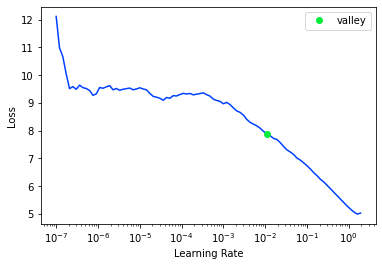

<Figure size 720x720 with 0 Axes>

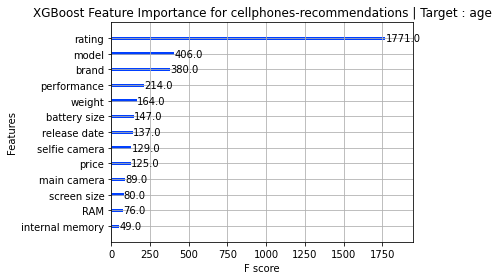

Target Variable: release date
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['gender']
16
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'gender_na']
Tabular Object size: 855


  0%|          | 0/42 [00:00<?, ?it/s]

AdaBoostRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BaggingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BayesianRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DecisionTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DummyRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNet model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNetCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').


 36%|███▌      | 15/42 [00:00<00:00, 142.63it/s]

ExtraTreesRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
GammaRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
GaussianProcessRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
GradientBoostingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
HistGradientBoostingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
HuberRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
KNeighborsRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
KernelRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Lars model failed to execute
Input contains NaN, infinity or a value 

 71%|███████▏  | 30/42 [00:00<00:00, 142.56it/s]

PoissonRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
QuantileRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RANSACRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RandomForestRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Ridge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RidgeCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
SGDRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').


100%|██████████| 42/42 [00:00<00:00, 139.98it/s]


SVR model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
TransformedTargetRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
TweedieRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
XGBRegressor model failed to execute
[02:47:41] ../src/data/data.cc:458: Check failed: valid: Label contains NaN, infinity or a value too large.
Stack trace:
  [bt] (0) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x16b9c9) [0x7fb6a79599c9]
  [bt] (1) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x178eb6) [0x7fb6a7966eb6]
  [bt] (2) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x179d10) [0x7fb6a7967d10]
  [bt] (3) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(XGDMatrixSetInfoFromInterface+0xa4) [0x7fb6a78aa754]
  [bt] (4) /opt/conda/lib/python3.7/lib-dynload/../../libffi.so.8

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Could not fit model
XGBoost failed
Target Variable: price


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


  5%|▍         | 2/42 [00:00<00:02, 16.58it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9715708922917914, 'Adjusted R-Squared': 0.9682042874316088, 'RMSE': 1.537826941128123, 'Time taken': 0.08011865615844727}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03999829292297363}
{'Model': 'BayesianRidge', 'R-Squared': 0.9131318306624859, 'Adjusted R-Squared': 0.9028448106093593, 'RMSE': 2.6881666275645815, 'Time taken': 0.02719855308532715}


 12%|█▏        | 5/42 [00:00<00:01, 20.53it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05735206604003906}
{'Model': 'DummyRegressor', 'R-Squared': -0.005627659355793568, 'Adjusted R-Squared': -0.12471514533213757, 'RMSE': 9.146279220717284, 'Time taken': 0.040457963943481445}
{'Model': 'ElasticNet', 'R-Squared': 0.822420332259961, 'Adjusted R-Squared': 0.8013911610802196, 'RMSE': 3.843460924878284, 'Time taken': 0.01935124397277832}


 19%|█▉        | 8/42 [00:00<00:02, 16.77it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.9132769892733461, 'Adjusted R-Squared': 0.903007159055716, 'RMSE': 2.6859196958902967, 'Time taken': 0.1625058650970459}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02557992935180664}


 24%|██▍       | 10/42 [00:00<00:02, 13.01it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.1981954574584961}
{'Model': 'GammaRegressor', 'R-Squared': 0.7904298613561591, 'Adjusted R-Squared': 0.7656123449378095, 'RMSE': 4.1753275483792, 'Time taken': 0.0228579044342041}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9855694956798522, 'Adjusted R-Squared': 0.9838606201682557, 'RMSE': 1.0956367857390588, 'Time taken': 0.13115668296813965}


 29%|██▊       | 12/42 [00:00<00:03,  9.94it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9996596848736509, 'Adjusted R-Squared': 0.9996193843981621, 'RMSE': 0.1682544181643636, 'Time taken': 0.17206645011901855}


 40%|████      | 17/42 [00:01<00:02, 10.87it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999837851228354, 'Adjusted R-Squared': 0.9999818649400133, 'RMSE': 0.036726765505718344, 'Time taken': 0.31833958625793457}
{'Model': 'HuberRegressor', 'R-Squared': 0.9058416999548358, 'Adjusted R-Squared': 0.8946913749494874, 'RMSE': 2.7986923140056668, 'Time taken': 0.06794214248657227}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9975113979732368, 'Adjusted R-Squared': 0.9972166951016465, 'RMSE': 0.4549918063653993, 'Time taken': 0.026786327362060547}
{'Model': 'KernelRidge', 'R-Squared': -2.1475513375823403, 'Adjusted R-Squared': -2.5202876801907754, 'RMSE': 16.181257226541106, 'Time taken': 0.04686403274536133}
{'Model': 'Lars', 'R-Squared': 0.913072917858799, 'Adjusted R-Squared': 0.9027789212894461, 'RMSE': 2.6890780119788023, 'Time taken': 0.026844024658203125}


 45%|████▌     | 19/42 [00:01<00:01, 11.68it/s]

{'Model': 'LarsCV', 'R-Squared': 0.9131559814212125, 'Adjusted R-Squared': 0.902871821326356, 'RMSE': 2.68779292464755, 'Time taken': 0.09285140037536621}
{'Model': 'Lasso', 'R-Squared': 0.8300390801497879, 'Adjusted R-Squared': 0.8099121291148943, 'RMSE': 3.7601085874434403, 'Time taken': 0.03846144676208496}
{'Model': 'LassoCV', 'R-Squared': 0.9131482497251246, 'Adjusted R-Squared': 0.9028631740346789, 'RMSE': 2.6879125686706216, 'Time taken': 0.1507730484008789}


 55%|█████▍    | 23/42 [00:01<00:01, 11.95it/s]

{'Model': 'LassoLars', 'R-Squared': -0.005627659355793568, 'Adjusted R-Squared': -0.12471514533213757, 'RMSE': 9.146279220717284, 'Time taken': 0.04470014572143555}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9131559814212125, 'Adjusted R-Squared': 0.902871821326356, 'RMSE': 2.68779292464755, 'Time taken': 0.09072518348693848}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9132277642246105, 'Adjusted R-Squared': 0.9029521047248933, 'RMSE': 2.6866818682970024, 'Time taken': 0.0365602970123291}
{'Model': 'LinearRegression', 'R-Squared': 0.9130729178587988, 'Adjusted R-Squared': 0.902778921289446, 'RMSE': 2.6890780119788036, 'Time taken': 0.023198843002319336}
{'Model': 'LinearSVR', 'R-Squared': 0.8953486855306774, 'Adjusted R-Squared': 0.8829557667119418, 'RMSE': 2.9505174969095225, 'Time taken': 0.03634333610534668}


 67%|██████▋   | 28/42 [00:03<00:02,  5.21it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9447121330294699, 'Adjusted R-Squared': 0.938164885625065, 'RMSE': 2.1445726746663896, 'Time taken': 1.4038734436035156}
{'Model': 'NuSVR', 'R-Squared': 0.9693113370222483, 'Adjusted R-Squared': 0.9656771532485671, 'RMSE': 1.5977721042581516, 'Time taken': 0.09570074081420898}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.6337231403950485, 'Adjusted R-Squared': 0.5903482491260411, 'RMSE': 5.519892139504704, 'Time taken': 0.024491310119628906}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.8726777633607332, 'Adjusted R-Squared': 0.8576001300745042, 'RMSE': 3.2544528216898763, 'Time taken': 0.03650784492492676}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.8299669956996849, 'Adjusted R-Squared': 0.8098315083483318, 'RMSE': 3.760905878453035, 'Time taken': 0.02623891830444336}


 74%|███████▍  | 31/42 [00:03<00:01,  7.38it/s]

{'Model': 'PoissonRegressor', 'R-Squared': 0.8942972288965406, 'Adjusted R-Squared': 0.8817797954763941, 'RMSE': 2.9653027273888353, 'Time taken': 0.04100608825683594}


 79%|███████▊  | 33/42 [00:10<00:09,  1.03s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.012734485804103857, 'Adjusted R-Squared': -0.1326635696493268, 'RMSE': 9.178540953489781, 'Time taken': 7.193215847015381}
{'Model': 'RANSACRegressor', 'R-Squared': 0.896206204353256, 'Adjusted R-Squared': 0.8839148338161417, 'RMSE': 2.9384042776793406, 'Time taken': 0.06209731101989746}


 88%|████████▊ | 37/42 [00:11<00:02,  1.69it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2852134704589844}
{'Model': 'Ridge', 'R-Squared': 0.9131031272908869, 'Adjusted R-Squared': 0.9028127081542814, 'RMSE': 2.6886107089434645, 'Time taken': 0.01597428321838379}
{'Model': 'RidgeCV', 'R-Squared': 0.9131031272909013, 'Adjusted R-Squared': 0.9028127081542975, 'RMSE': 2.688610708943243, 'Time taken': 0.043749094009399414}
{'Model': 'SGDRegressor', 'R-Squared': 0.9127440601345055, 'Adjusted R-Squared': 0.9024111198872758, 'RMSE': 2.6941597957599877, 'Time taken': 0.05740761756896973}


 93%|█████████▎| 39/42 [00:11<00:01,  2.28it/s]

{'Model': 'SVR', 'R-Squared': 0.9691785850938309, 'Adjusted R-Squared': 0.9655286806970478, 'RMSE': 1.6012241679952834, 'Time taken': 0.07411456108093262}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9130729178587988, 'Adjusted R-Squared': 0.902778921289446, 'RMSE': 2.6890780119788036, 'Time taken': 0.020804166793823242}
{'Model': 'TweedieRegressor', 'R-Squared': 0.8057982037640682, 'Adjusted R-Squared': 0.7828006226308657, 'RMSE': 4.019318960801546, 'Time taken': 0.02725839614868164}


100%|██████████| 42/42 [00:12<00:00,  3.48it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999997690994, 'Adjusted R-Squared': 0.9999999997417559, 'RMSE': 0.00013859208, 'Time taken': 0.4858720302581787}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999827357020333, 'Adjusted R-Squared': 0.9999806912456952, 'RMSE': 0.03789660560926865, 'Time taken': 0.08145928382873535}
Project: cellphones-recommendations
cellphones-recommendations
Target: price
price
Target Standard Deviation: 8.489981462468759
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.06
RandomForestRegressor                        1.00       1.00  0.00        0.29
BaggingRegressor                             1.00       1.00  0.00        0.04
ExtraTreeRegressor                           1.00       1.00  0.00        0.03
ExtraTreesRegressor                          1.00       1.00  0.00        

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0      21      21.00
1      26      26.00
2      29      29.00
3      25      25.00
4      24      24.00
XGBoost RMSE:  0.00013859208


<Figure size 432x288 with 0 Axes>

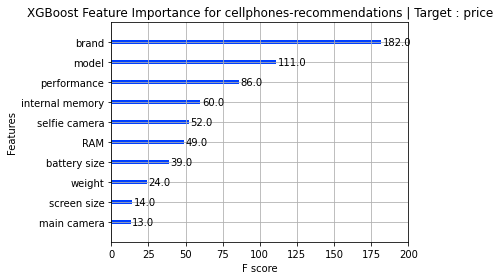

Target Variable: weight
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 10%|▉         | 4/42 [00:00<00:02, 17.55it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9453482407442987, 'Adjusted R-Squared': 0.9388763218850709, 'RMSE': 1.6892842284650367, 'Time taken': 0.1186068058013916}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.035669803619384766}
{'Model': 'BayesianRidge', 'R-Squared': 0.7840156529098534, 'Adjusted R-Squared': 0.758438559175494, 'RMSE': 3.3582404862069657, 'Time taken': 0.0367734432220459}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05312609672546387}
{'Model': 'DummyRegressor', 'R-Squared': -8.2891789578321e-05, 'Adjusted R-Squared': -0.11851376055413376, 'RMSE': 7.226344355984836, 'Time taken': 0.03794503211975098}
{'Model': 'ElasticNet', 'R-Squared': 0.5175654520573756, 'Adjusted R-Squared': 0.4604350450641701, 'RMSE': 5.019030727434334, 'Time taken': 0.027601003646850586}


 17%|█▋        | 7/42 [00:00<00:02, 15.17it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.7829074583512532, 'Adjusted R-Squared': 0.7571991310507437, 'RMSE': 3.3668448649974816, 'Time taken': 0.14876627922058105}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024825572967529297}


 26%|██▌       | 11/42 [00:00<00:02, 13.62it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.20065641403198242}
{'Model': 'GammaRegressor', 'R-Squared': 0.5246659788812765, 'Adjusted R-Squared': 0.46837642374879607, 'RMSE': 4.981958479404834, 'Time taken': 0.021930694580078125}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9776051143482192, 'Adjusted R-Squared': 0.9749530884157714, 'RMSE': 1.081371896861739, 'Time taken': 0.08481597900390625}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9998355850380068, 'Adjusted R-Squared': 0.9998161148451392, 'RMSE': 0.09265552524553455, 'Time taken': 0.1551985740661621}


 38%|███▊      | 16/42 [00:01<00:02, 10.85it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999300528159267, 'Adjusted R-Squared': 0.9999217695967602, 'RMSE': 0.06043461667679114, 'Time taken': 0.31539201736450195}
{'Model': 'HuberRegressor', 'R-Squared': 0.7478317439914404, 'Adjusted R-Squared': 0.7179697136746372, 'RMSE': 3.6286565258353174, 'Time taken': 0.05863142013549805}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.987899950223992, 'Adjusted R-Squared': 0.9864670495926227, 'RMSE': 0.7948665708765692, 'Time taken': 0.026444435119628906}
{'Model': 'KernelRidge', 'R-Squared': -3.4618477141059154, 'Adjusted R-Squared': -3.9902244170921426, 'RMSE': 15.263636885905132, 'Time taken': 0.03923535346984863}
{'Model': 'Lars', 'R-Squared': -0.09876812133720891, 'Adjusted R-Squared': -0.22888539886398362, 'RMSE': 7.574494934264565, 'Time taken': 0.026926755905151367}


 45%|████▌     | 19/42 [00:01<00:01, 13.74it/s]

{'Model': 'LarsCV', 'R-Squared': 0.6017514302259852, 'Adjusted R-Squared': 0.5545904153843255, 'RMSE': 4.560135699780846, 'Time taken': 0.061609745025634766}
{'Model': 'Lasso', 'R-Squared': 0.5005119460983772, 'Adjusted R-Squared': 0.4413620449784482, 'RMSE': 5.106968828158563, 'Time taken': 0.022792816162109375}
{'Model': 'LassoCV', 'R-Squared': 0.783256217527456, 'Adjusted R-Squared': 0.7575891906557074, 'RMSE': 3.3641393597619733, 'Time taken': 0.14885783195495605}


 55%|█████▍    | 23/42 [00:01<00:01, 13.01it/s]

{'Model': 'LassoLars', 'R-Squared': -8.2891789578321e-05, 'Adjusted R-Squared': -0.11851376055413376, 'RMSE': 7.226344355984836, 'Time taken': 0.03662991523742676}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7828116337993064, 'Adjusted R-Squared': 0.7570919588544874, 'RMSE': 3.3675878449365437, 'Time taken': 0.10181212425231934}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7836628931470528, 'Adjusted R-Squared': 0.7580440252302565, 'RMSE': 3.3609818163428704, 'Time taken': 0.03807520866394043}
{'Model': 'LinearRegression', 'R-Squared': 0.7850796107501194, 'Adjusted R-Squared': 0.7596285120231598, 'RMSE': 3.3499587809011104, 'Time taken': 0.023597002029418945}
{'Model': 'LinearSVR', 'R-Squared': 0.7530394224499173, 'Adjusted R-Squared': 0.7237940908979338, 'RMSE': 3.590992269392045, 'Time taken': 0.026056289672851562}


 67%|██████▋   | 28/42 [00:03<00:02,  5.39it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9360185752019683, 'Adjusted R-Squared': 0.9284418275285171, 'RMSE': 1.8277955165014605, 'Time taken': 1.4217689037322998}
{'Model': 'NuSVR', 'R-Squared': 0.8791517566225363, 'Adjusted R-Squared': 0.8648407804330998, 'RMSE': 2.512006883365313, 'Time taken': 0.09057903289794922}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5078850964711277, 'Adjusted R-Squared': 0.4496083315795507, 'RMSE': 5.069135648535062, 'Time taken': 0.024741649627685547}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7021495435066316, 'Adjusted R-Squared': 0.6668777789218906, 'RMSE': 3.943662939120497, 'Time taken': 0.03914999961853027}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.5673256121607699, 'Adjusted R-Squared': 0.5160878557061243, 'RMSE': 4.753147024032932, 'Time taken': 0.026096343994140625}


 74%|███████▍  | 31/42 [00:03<00:01,  7.25it/s]

{'Model': 'PoissonRegressor', 'R-Squared': 0.6939351876408626, 'Adjusted R-Squared': 0.6576906703878068, 'RMSE': 3.9976738136315118, 'Time taken': 0.08364057540893555}


 79%|███████▊  | 33/42 [00:12<00:11,  1.24s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.023643603786603462, 'Adjusted R-Squared': -0.14486455686659605, 'RMSE': 7.310970687798592, 'Time taken': 8.817458152770996}
{'Model': 'RANSACRegressor', 'R-Squared': 0.47486001095982, 'Adjusted R-Squared': 0.412672380678746, 'RMSE': 5.236464932545462, 'Time taken': 0.1748981475830078}


 90%|█████████ | 38/42 [00:13<00:02,  1.60it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2809011936187744}
{'Model': 'Ridge', 'R-Squared': 0.7846298729840108, 'Adjusted R-Squared': 0.7591255158373804, 'RMSE': 3.3534619748891177, 'Time taken': 0.01746678352355957}
{'Model': 'RidgeCV', 'R-Squared': 0.7846298729839776, 'Adjusted R-Squared': 0.7591255158373433, 'RMSE': 3.353461974889376, 'Time taken': 0.031539201736450195}
{'Model': 'SGDRegressor', 'R-Squared': 0.7840988444113247, 'Adjusted R-Squared': 0.7585316023021395, 'RMSE': 3.3575936708717937, 'Time taken': 0.03610539436340332}
{'Model': 'SVR', 'R-Squared': 0.8971593218929006, 'Adjusted R-Squared': 0.8849808205381124, 'RMSE': 2.317304579692958, 'Time taken': 0.09012341499328613}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7850796107501194, 'Adjusted R-Squared': 0.7596285120231598, 'RMSE': 3.3499587809011104, 'Time taken': 0.01825237274169922}
{'Model': 'TweedieRegressor', 'R-Squared': 0.5194498415348947

100%|██████████| 42/42 [00:13<00:00,  3.07it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999995549425, 'Adjusted R-Squared': 0.9999999995022383, 'RMSE': 0.00015244343, 'Time taken': 0.46294069290161133}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999322871177259, 'Adjusted R-Squared': 0.9999242684869303, 'RMSE': 0.059461560740396935, 'Time taken': 0.07791948318481445}
Project: cellphones-recommendations
cellphones-recommendations
Target: weight
weight
Target Standard Deviation: 7.043473507339694
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.05
RandomForestRegressor                        1.00       1.00  0.00        0.28
BaggingRegressor                             1.00       1.00  0.00        0.04
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00       1.00  0.00    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0      18      18.00
1      15      15.00
2      20      20.00
3       9       9.00
4      18      18.00
XGBoost RMSE:  0.00015244343


<Figure size 432x288 with 0 Axes>

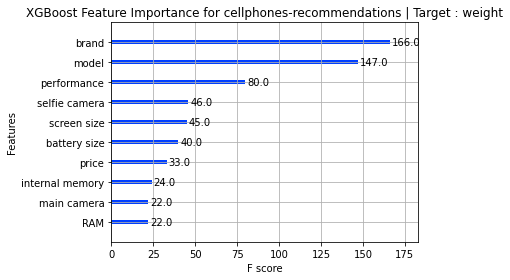

Target Variable: screen size
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 12%|█▏        | 5/42 [00:00<00:01, 23.02it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9697949217041383, 'Adjusted R-Squared': 0.966218004537523, 'RMSE': 0.32878298861039146, 'Time taken': 0.13158202171325684}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.039223432540893555}
{'Model': 'BayesianRidge', 'R-Squared': 0.8139680502554024, 'Adjusted R-Squared': 0.7919379509435421, 'RMSE': 0.8159492072940875, 'Time taken': 0.024957895278930664}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.025084257125854492}
{'Model': 'DummyRegressor', 'R-Squared': -0.0068378038758507564, 'Adjusted R-Squared': -0.12606859644009627, 'RMSE': 1.898231223799916, 'Time taken': 0.021297454833984375}
{'Model': 'ElasticNet', 'R-Squared': 0.5455927207394742, 'Adjusted R-Squared': 0.49178133240599087, 'RMSE': 1.2752402032590529, 'Time taken': 0.0237429141998291}


 19%|█▉        | 8/42 [00:00<00:01, 18.90it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.8137859100463161, 'Adjusted R-Squared': 0.7917342414991693, 'RMSE': 0.8163485494506093, 'Time taken': 0.1467735767364502}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.016608238220214844}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.18202424049377441}


 26%|██▌       | 11/42 [00:00<00:02, 11.22it/s]

{'Model': 'GammaRegressor', 'R-Squared': 0.6755290255619311, 'Adjusted R-Squared': 0.6371048312205807, 'RMSE': 1.077599254982072, 'Time taken': 0.04448294639587402}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.8850034188196485, 'Adjusted R-Squared': 0.8713854026272385, 'RMSE': 0.6415223930030612, 'Time taken': 0.1985180377960205}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9998743712052177, 'Adjusted R-Squared': 0.9998594941110988, 'RMSE': 0.0212038123739629, 'Time taken': 0.18273615837097168}


 38%|███▊      | 16/42 [00:01<00:02,  9.58it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.999952696712497, 'Adjusted R-Squared': 0.999947095007398, 'RMSE': 0.01301113006275952, 'Time taken': 0.31786417961120605}
{'Model': 'HuberRegressor', 'R-Squared': 0.8011934255425784, 'Adjusted R-Squared': 0.7776505417252522, 'RMSE': 0.8434993010592607, 'Time taken': 0.06978249549865723}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9854896414647198, 'Adjusted R-Squared': 0.9837713095329104, 'RMSE': 0.22788116324392305, 'Time taken': 0.02781820297241211}
{'Model': 'KernelRidge', 'R-Squared': -9.503110980264697, 'Adjusted R-Squared': -10.746900438453938, 'RMSE': 6.1309578891150425, 'Time taken': 0.061023712158203125}


 43%|████▎     | 18/42 [00:01<00:02, 10.48it/s]

{'Model': 'Lars', 'R-Squared': -1.8370389928401156, 'Adjusted R-Squared': -2.1730041367290767, 'RMSE': 3.1864125826666334, 'Time taken': 0.05687665939331055}
{'Model': 'LarsCV', 'R-Squared': 0.7284964649264689, 'Adjusted R-Squared': 0.6963447305098666, 'RMSE': 0.9857280163676703, 'Time taken': 0.07151460647583008}
{'Model': 'Lasso', 'R-Squared': 0.3344211264318674, 'Adjusted R-Squared': 0.25560257561458855, 'RMSE': 1.5433666805673922, 'Time taken': 0.03688311576843262}


 55%|█████▍    | 23/42 [00:02<00:01, 12.77it/s]

{'Model': 'LassoCV', 'R-Squared': 0.813585263655759, 'Adjusted R-Squared': 0.7915098343518358, 'RMSE': 0.8167882403746478, 'Time taken': 0.17993497848510742}
{'Model': 'LassoLars', 'R-Squared': -0.0068378038758507564, 'Adjusted R-Squared': -0.12606859644009627, 'RMSE': 1.898231223799916, 'Time taken': 0.023011207580566406}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8135978916285561, 'Adjusted R-Squared': 0.7915239577424641, 'RMSE': 0.8167605747657856, 'Time taken': 0.06481456756591797}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8135624723045767, 'Adjusted R-Squared': 0.7914843440248555, 'RMSE': 0.8168381697392235, 'Time taken': 0.03122544288635254}
{'Model': 'LinearRegression', 'R-Squared': 0.8135624723045765, 'Adjusted R-Squared': 0.7914843440248552, 'RMSE': 0.8168381697392241, 'Time taken': 0.03624773025512695}


 60%|█████▉    | 25/42 [00:02<00:01, 13.46it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.7754734720253014, 'Adjusted R-Squared': 0.7488848042388239, 'RMSE': 0.8964027624359848, 'Time taken': 0.08331942558288574}


 64%|██████▍   | 27/42 [00:03<00:03,  3.84it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9632078259265295, 'Adjusted R-Squared': 0.9588508579441448, 'RMSE': 0.36286667196328987, 'Time taken': 1.3845245838165283}
{'Model': 'NuSVR', 'R-Squared': 0.9930420644488509, 'Adjusted R-Squared': 0.9922180983967411, 'RMSE': 0.15780092941744986, 'Time taken': 0.13252758979797363}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5651750573191131, 'Adjusted R-Squared': 0.5136826298963765, 'RMSE': 1.2474598601917248, 'Time taken': 0.01778125762939453}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7922165257410219, 'Adjusted R-Squared': 0.7676105879998271, 'RMSE': 0.8623327054105915, 'Time taken': 0.03624558448791504}


 74%|███████▍  | 31/42 [00:03<00:01,  6.27it/s]

{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.468884469199239, 'Adjusted R-Squared': 0.4059892089728331, 'RMSE': 1.378681209616023, 'Time taken': 0.02679610252380371}
{'Model': 'PoissonRegressor', 'R-Squared': 0.7695745981115348, 'Adjusted R-Squared': 0.7422873794668481, 'RMSE': 0.9081017921143465, 'Time taken': 0.0343019962310791}


 79%|███████▊  | 33/42 [00:11<00:09,  1.01s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -3.822337752534821e-05, 'Adjusted R-Squared': -0.11846380246170596, 'RMSE': 1.8918106058539366, 'Time taken': 7.403210401535034}
{'Model': 'RANSACRegressor', 'R-Squared': 0.8048969530858849, 'Adjusted R-Squared': 0.7817926448986872, 'RMSE': 0.83560567695155, 'Time taken': 0.06722307205200195}


 90%|█████████ | 38/42 [00:11<00:02,  1.88it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2939319610595703}
{'Model': 'Ridge', 'R-Squared': 0.8138160082760968, 'Adjusted R-Squared': 0.791767903993003, 'RMSE': 0.8162825725979392, 'Time taken': 0.01787281036376953}
{'Model': 'RidgeCV', 'R-Squared': 0.8138160082760525, 'Adjusted R-Squared': 0.7917679039929535, 'RMSE': 0.8162825725980365, 'Time taken': 0.04453778266906738}
{'Model': 'SGDRegressor', 'R-Squared': 0.8120210043381437, 'Adjusted R-Squared': 0.7897603337992397, 'RMSE': 0.8202080330019793, 'Time taken': 0.027543306350708008}
{'Model': 'SVR', 'R-Squared': 0.990626326625779, 'Adjusted R-Squared': 0.9895162863577791, 'RMSE': 0.18315731323291717, 'Time taken': 0.08695602416992188}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8135624723045765, 'Adjusted R-Squared': 0.7914843440248552, 'RMSE': 0.8168381697392241, 'Time taken': 0.017152070999145508}
{'Model': 'TweedieRegressor', 'R-Squared': 0.67117014199583

100%|██████████| 42/42 [00:12<00:00,  3.40it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999969675897, 'Adjusted R-Squared': 0.9999999966084885, 'RMSE': 0.00010417496, 'Time taken': 0.490797758102417}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999491079102171, 'Adjusted R-Squared': 0.9999430812153743, 'RMSE': 0.013495671493403909, 'Time taken': 0.0881352424621582}
Project: cellphones-recommendations
cellphones-recommendations
Target: screen size
screen size
Target Standard Deviation: 2.0031667373265636
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.03
RandomForestRegressor                        1.00       1.00  0.00        0.29
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00       1.00  0.00        0.18
BaggingRegressor                             1.00       1.00  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       8       8.00
1       5       5.00
2       6       6.00
3       8       8.00
4       7       7.00
XGBoost RMSE:  0.00010417496


<Figure size 432x288 with 0 Axes>

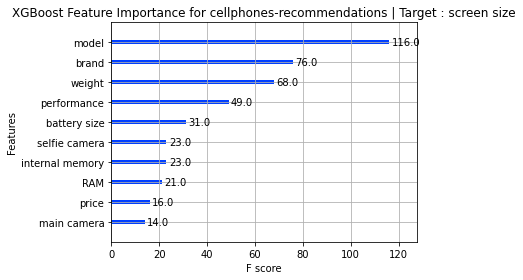

Target Variable: battery size
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 10%|▉         | 4/42 [00:00<00:01, 29.38it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9008338495510156, 'Adjusted R-Squared': 0.8890904896294254, 'RMSE': 1.5475823866819642, 'Time taken': 0.019236326217651367}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03366684913635254}
{'Model': 'BayesianRidge', 'R-Squared': 0.8620733323865586, 'Adjusted R-Squared': 0.8457399112218089, 'RMSE': 1.8251399558997554, 'Time taken': 0.046097755432128906}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.036815643310546875}
{'Model': 'DummyRegressor', 'R-Squared': -0.000716850699646443, 'Adjusted R-Squared': -0.11922279354565735, 'RMSE': 4.916178660922239, 'Time taken': 0.020702362060546875}
{'Model': 'ElasticNet', 'R-Squared': 0.727598097827072, 'Adjusted R-Squared': 0.6953399778329095, 'RMSE': 2.5649394599479973, 'Time taken': 0.022716045379638672}


 17%|█▋        | 7/42 [00:00<00:01, 18.54it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.8624903142073808, 'Adjusted R-Squared': 0.8462062724687811, 'RMSE': 1.8223789733038973, 'Time taken': 0.1677863597869873}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02377915382385254}


 24%|██▍       | 10/42 [00:00<00:02, 15.10it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9999999757863763, 'Adjusted R-Squared': 0.9999999729189736, 'RMSE': 0.0007647191129019921, 'Time taken': 0.19646859169006348}
{'Model': 'GammaRegressor', 'R-Squared': 0.7398088955135959, 'Adjusted R-Squared': 0.7089967910349427, 'RMSE': 2.506791845701303, 'Time taken': 0.02255535125732422}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9699158617928879, 'Adjusted R-Squared': 0.9663532664788878, 'RMSE': 0.8523948920995918, 'Time taken': 0.08709406852722168}


 29%|██▊       | 12/42 [00:00<00:02, 11.78it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9996342268971258, 'Adjusted R-Squared': 0.9995909116612591, 'RMSE': 0.09398919592279782, 'Time taken': 0.17313265800476074}


 33%|███▎      | 14/42 [00:01<00:03,  8.38it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999914038245976, 'Adjusted R-Squared': 0.9999903858564578, 'RMSE': 0.014408696223070278, 'Time taken': 0.3350205421447754}
{'Model': 'HuberRegressor', 'R-Squared': 0.8491572717720244, 'Adjusted R-Squared': 0.8312943171134484, 'RMSE': 1.9086849115225937, 'Time taken': 0.06939053535461426}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9987893188183752, 'Adjusted R-Squared': 0.9986459486784459, 'RMSE': 0.17099639201419245, 'Time taken': 0.02676868438720703}
{'Model': 'KernelRidge', 'R-Squared': -5.152760457887066, 'Adjusted R-Squared': -5.8813768279000085, 'RMSE': 12.190094002052687, 'Time taken': 0.05892062187194824}


 45%|████▌     | 19/42 [00:01<00:01, 12.02it/s]

{'Model': 'Lars', 'R-Squared': -2.3529029688414687, 'Adjusted R-Squared': -2.7499572677832216, 'RMSE': 8.9987573994043, 'Time taken': 0.05333685874938965}
{'Model': 'LarsCV', 'R-Squared': 0.6437263917070255, 'Adjusted R-Squared': 0.6015360959881206, 'RMSE': 2.9333499468306323, 'Time taken': 0.07539725303649902}
{'Model': 'Lasso', 'R-Squared': 0.6823652173549134, 'Adjusted R-Squared': 0.6447505720416795, 'RMSE': 2.7697213448526408, 'Time taken': 0.03693842887878418}


 55%|█████▍    | 23/42 [00:01<00:01, 11.54it/s]

{'Model': 'LassoCV', 'R-Squared': 0.8619375518670456, 'Adjusted R-Squared': 0.8455880514302483, 'RMSE': 1.826038105239148, 'Time taken': 0.18432092666625977}
{'Model': 'LassoLars', 'R-Squared': -0.000716850699646443, 'Adjusted R-Squared': -0.11922279354565735, 'RMSE': 4.916178660922239, 'Time taken': 0.03922915458679199}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8616450547556478, 'Adjusted R-Squared': 0.8452609165030271, 'RMSE': 1.8279713908199626, 'Time taken': 0.09503054618835449}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8616450547556478, 'Adjusted R-Squared': 0.8452609165030271, 'RMSE': 1.8279713908199626, 'Time taken': 0.0490269660949707}


 60%|█████▉    | 25/42 [00:02<00:01, 12.60it/s]

{'Model': 'LinearRegression', 'R-Squared': 0.8616450547556481, 'Adjusted R-Squared': 0.8452609165030275, 'RMSE': 1.8279713908199606, 'Time taken': 0.04645943641662598}
{'Model': 'LinearSVR', 'R-Squared': 0.8343730236825225, 'Adjusted R-Squared': 0.8147593028028213, 'RMSE': 2.0000349630427006, 'Time taken': 0.07236051559448242}


 64%|██████▍   | 27/42 [00:03<00:04,  3.66it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9175117286143911, 'Adjusted R-Squared': 0.907743380687148, 'RMSE': 1.4114586263607816, 'Time taken': 1.37839674949646}
{'Model': 'NuSVR', 'R-Squared': 0.9583042385677096, 'Adjusted R-Squared': 0.9533665826086226, 'RMSE': 1.0035014528308914, 'Time taken': 0.1042170524597168}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.4868156620596005, 'Adjusted R-Squared': 0.42604383256665845, 'RMSE': 3.5205356603705455, 'Time taken': 0.022938013076782227}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.8117527799503166, 'Adjusted R-Squared': 0.7894603459970646, 'RMSE': 2.1322412295505924, 'Time taken': 0.035688161849975586}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.6783719572441717, 'Adjusted R-Squared': 0.640284425865192, 'RMSE': 2.7870772411482276, 'Time taken': 0.024337053298950195}


 74%|███████▍  | 31/42 [00:03<00:01,  6.15it/s]

{'Model': 'PoissonRegressor', 'R-Squared': 0.8261664707006067, 'Adjusted R-Squared': 0.80558092117831, 'RMSE': 2.048985215785721, 'Time taken': 0.0343937873840332}


 79%|███████▊  | 33/42 [00:11<00:09,  1.10s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.03949086254524836, 'Adjusted R-Squared': -0.16258846468876476, 'RMSE': 5.010515258728094, 'Time taken': 7.860099792480469}
{'Model': 'RANSACRegressor', 'R-Squared': 0.7947478272262615, 'Adjusted R-Squared': 0.7704416488714767, 'RMSE': 2.226465308515422, 'Time taken': 0.12411117553710938}


 88%|████████▊ | 37/42 [00:12<00:03,  1.56it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.26837730407714844}
{'Model': 'Ridge', 'R-Squared': 0.8620107007700382, 'Adjusted R-Squared': 0.8456698627033321, 'RMSE': 1.825554301050374, 'Time taken': 0.01640462875366211}
{'Model': 'RidgeCV', 'R-Squared': 0.861685848649372, 'Adjusted R-Squared': 0.8453065412525871, 'RMSE': 1.8277018826789095, 'Time taken': 0.04423165321350098}
{'Model': 'SGDRegressor', 'R-Squared': 0.8627410312065035, 'Adjusted R-Squared': 0.8464866796388526, 'RMSE': 1.820716872782382, 'Time taken': 0.077972412109375}


 95%|█████████▌| 40/42 [00:12<00:00,  2.37it/s]

{'Model': 'SVR', 'R-Squared': 0.9580127569872798, 'Adjusted R-Squared': 0.9530405834726156, 'RMSE': 1.0070029211024285, 'Time taken': 0.06565165519714355}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8616450547556481, 'Adjusted R-Squared': 0.8452609165030275, 'RMSE': 1.8279713908199606, 'Time taken': 0.01900315284729004}
{'Model': 'TweedieRegressor', 'R-Squared': 0.7512702861435335, 'Adjusted R-Squared': 0.7218154516078994, 'RMSE': 2.4509580955991845, 'Time taken': 0.05098152160644531}


100%|██████████| 42/42 [00:12<00:00,  3.30it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999994863695, 'Adjusted R-Squared': 0.9999999994255448, 'RMSE': 0.00011137749, 'Time taken': 0.4672210216522217}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999913413229297, 'Adjusted R-Squared': 0.9999903159532766, 'RMSE': 0.014460983225864296, 'Time taken': 0.09249663352966309}
Project: cellphones-recommendations
cellphones-recommendations
Target: battery size
battery size
Target Standard Deviation: 5.088051175570752
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.04
RandomForestRegressor                        1.00       1.00  0.00        0.27
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
BaggingRegressor                             1.00       1.00  0.00        0.03
XGBRegressor                                 1.00       1.0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0      17      17.00
1      10      10.00
2      12      12.00
3      12      12.00
4      12      12.00
XGBoost RMSE:  0.00011137749


<Figure size 432x288 with 0 Axes>

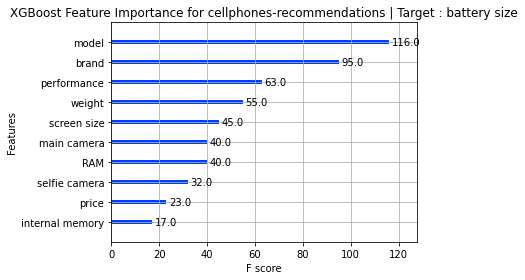

Target Variable: selfie camera
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 12%|█▏        | 5/42 [00:00<00:01, 23.61it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.940426259755994, 'Adjusted R-Squared': 0.9333714747270986, 'RMSE': 0.7839558881493575, 'Time taken': 0.11797785758972168}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03679323196411133}
{'Model': 'BayesianRidge', 'R-Squared': 0.6937603512774572, 'Adjusted R-Squared': 0.6574951297182087, 'RMSE': 1.7774398042941582, 'Time taken': 0.030697107315063477}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.025422334671020508}
{'Model': 'DummyRegressor', 'R-Squared': -0.00021215797813445292, 'Adjusted R-Squared': -0.11865833458080832, 'RMSE': 3.2122568009646306, 'Time taken': 0.0217437744140625}
{'Model': 'ElasticNet', 'R-Squared': 0.4351295860158574, 'Adjusted R-Squared': 0.3682370369914194, 'RMSE': 2.4140074544471366, 'Time taken': 0.023165464401245117}


 19%|█▉        | 8/42 [00:00<00:01, 18.50it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.693661913452067, 'Adjusted R-Squared': 0.657385034781917, 'RMSE': 1.7777254519098264, 'Time taken': 0.15105009078979492}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02364492416381836}


 24%|██▍       | 10/42 [00:00<00:02, 14.03it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.19695663452148438}
{'Model': 'GammaRegressor', 'R-Squared': 0.5121233738629434, 'Adjusted R-Squared': 0.45434851024144984, 'RMSE': 2.243464483458248, 'Time taken': 0.015213251113891602}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9504205714806441, 'Adjusted R-Squared': 0.9445493233665099, 'RMSE': 0.7151793248126735, 'Time taken': 0.09934520721435547}


 29%|██▊       | 12/42 [00:00<00:02, 10.84it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9996583556943455, 'Adjusted R-Squared': 0.9996178978160443, 'RMSE': 0.05936784516364448, 'Time taken': 0.17747902870178223}


 33%|███▎      | 14/42 [00:01<00:03,  8.12it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999638271256568, 'Adjusted R-Squared': 0.9999595434958004, 'RMSE': 0.019317712687192228, 'Time taken': 0.32234883308410645}
{'Model': 'HuberRegressor', 'R-Squared': 0.6570326235533719, 'Adjusted R-Squared': 0.6164180658162712, 'RMSE': 1.8810078079510506, 'Time taken': 0.0620419979095459}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9907942001312727, 'Adjusted R-Squared': 0.9897040396205024, 'RMSE': 0.3081732633339858, 'Time taken': 0.028130769729614258}
{'Model': 'KernelRidge', 'R-Squared': -3.6409640742334233, 'Adjusted R-Squared': -4.190551925129487, 'RMSE': 6.9193977484784375, 'Time taken': 0.06505775451660156}


 40%|████      | 17/42 [00:01<00:02, 10.55it/s]

{'Model': 'Lars', 'R-Squared': 0.6941519509618996, 'Adjusted R-Squared': 0.657933103049493, 'RMSE': 1.7763030025668463, 'Time taken': 0.05486416816711426}
{'Model': 'LarsCV', 'R-Squared': 0.693406407916855, 'Adjusted R-Squared': 0.6570992720122721, 'RMSE': 1.778466665687376, 'Time taken': 0.05916905403137207}
{'Model': 'Lasso', 'R-Squared': 0.35454621842275824, 'Adjusted R-Squared': 0.278110902183348, 'RMSE': 2.580457837346896, 'Time taken': 0.02354741096496582}


 55%|█████▍    | 23/42 [00:01<00:01, 13.63it/s]

{'Model': 'LassoCV', 'R-Squared': 0.6933050173117747, 'Adjusted R-Squared': 0.6569858746250112, 'RMSE': 1.7787607111444794, 'Time taken': 0.15726661682128906}
{'Model': 'LassoLars', 'R-Squared': -0.00021215797813445292, 'Adjusted R-Squared': -0.11865833458080832, 'RMSE': 3.2122568009646306, 'Time taken': 0.02336597442626953}
{'Model': 'LassoLarsCV', 'R-Squared': 0.693406407916855, 'Adjusted R-Squared': 0.6570992720122721, 'RMSE': 1.778466665687376, 'Time taken': 0.056203365325927734}
{'Model': 'LassoLarsIC', 'R-Squared': 0.6916864936520823, 'Adjusted R-Squared': 0.6551756836898289, 'RMSE': 1.78344806853575, 'Time taken': 0.0369570255279541}
{'Model': 'LinearRegression', 'R-Squared': 0.6941519509618997, 'Adjusted R-Squared': 0.6579331030494932, 'RMSE': 1.7763030025668456, 'Time taken': 0.04757046699523926}


 60%|█████▉    | 25/42 [00:01<00:01, 14.21it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.6449979495145672, 'Adjusted R-Squared': 0.6029582330097134, 'RMSE': 1.9137254101814731, 'Time taken': 0.06686878204345703}


 64%|██████▍   | 27/42 [00:03<00:03,  3.98it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9359462787306702, 'Adjusted R-Squared': 0.9283609696329863, 'RMSE': 0.8128985997203652, 'Time taken': 1.4189364910125732}
{'Model': 'NuSVR', 'R-Squared': 0.9483986671876521, 'Adjusted R-Squared': 0.9422879830388214, 'RMSE': 0.7296165090605573, 'Time taken': 0.1098184585571289}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.33673722152378305, 'Adjusted R-Squared': 0.2581929451252837, 'RMSE': 2.6158148779736314, 'Time taken': 0.019049644470214844}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.6366223377623483, 'Adjusted R-Squared': 0.5935907724973633, 'RMSE': 1.9361691942938442, 'Time taken': 0.0395050048828125}


 74%|███████▍  | 31/42 [00:03<00:01,  6.32it/s]

{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.7485204356960993, 'Adjusted R-Squared': -0.9555820662390584, 'RMSE': 4.247169062897551, 'Time taken': 0.03195929527282715}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6249541851785839, 'Adjusted R-Squared': 0.5805408650023636, 'RMSE': 1.9670090333155656, 'Time taken': 0.0335078239440918}


 79%|███████▊  | 33/42 [00:10<00:08,  1.06it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0050420669453465905, 'Adjusted R-Squared': -0.12406020645203242, 'RMSE': 3.220003269034495, 'Time taken': 6.858980178833008}
{'Model': 'RANSACRegressor', 'R-Squared': 0.6226183212648122, 'Adjusted R-Squared': 0.577928385625119, 'RMSE': 1.9731249974129432, 'Time taken': 0.16195940971374512}


 90%|█████████ | 38/42 [00:11<00:02,  2.00it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.27542996406555176}
{'Model': 'Ridge', 'R-Squared': 0.6940806382540837, 'Adjusted R-Squared': 0.6578533454157516, 'RMSE': 1.7765100753181418, 'Time taken': 0.01601886749267578}
{'Model': 'RidgeCV', 'R-Squared': 0.6940806382540734, 'Adjusted R-Squared': 0.65785334541574, 'RMSE': 1.7765100753181717, 'Time taken': 0.032968997955322266}
{'Model': 'SGDRegressor', 'R-Squared': 0.6936041786091112, 'Adjusted R-Squared': 0.6573204629180849, 'RMSE': 1.777892965955289, 'Time taken': 0.029973745346069336}
{'Model': 'SVR', 'R-Squared': 0.9485499476209849, 'Adjusted R-Squared': 0.9424571782603121, 'RMSE': 0.7285462099741243, 'Time taken': 0.08724164962768555}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.6941519509618997, 'Adjusted R-Squared': 0.6579331030494932, 'RMSE': 1.7763030025668456, 'Time taken': 0.016307353973388672}
{'Model': 'TweedieRegressor', 'R-Squared': 0.50959596352894

100%|██████████| 42/42 [00:11<00:00,  3.54it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.999999998323066, 'Adjusted R-Squared': 0.9999999981244817, 'RMSE': 0.0001315292, 'Time taken': 0.6213202476501465}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999637919506816, 'Adjusted R-Squared': 0.9999595041553676, 'RMSE': 0.01932710280294184, 'Time taken': 0.08304405212402344}
Project: cellphones-recommendations
cellphones-recommendations
Target: selfie camera
selfie camera
Target Standard Deviation: 3.1061908725322587
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.03
RandomForestRegressor                        1.00       1.00  0.00        0.28
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00       1.00  0.00        0.20
BaggingRegressor                             1.00       1.0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       2       2.00
1      12      12.00
2       6       6.00
3       8       8.00
4       7       7.00
XGBoost RMSE:  0.0001315292


<Figure size 432x288 with 0 Axes>

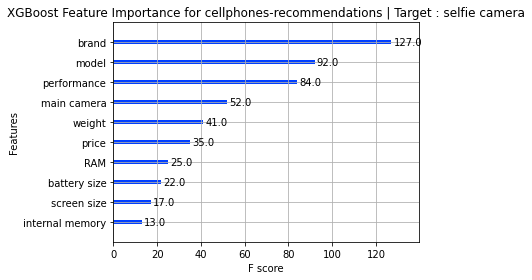

Target Variable: main camera
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 10%|▉         | 4/42 [00:00<00:02, 17.32it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.969663467304153, 'Adjusted R-Squared': 0.9660709831691184, 'RMSE': 0.28117068922979505, 'Time taken': 0.11800074577331543}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03466534614562988}
{'Model': 'BayesianRidge', 'R-Squared': 0.751172364524154, 'Adjusted R-Squared': 0.7217059340072776, 'RMSE': 0.8052604712830111, 'Time taken': 0.04427456855773926}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05017852783203125}
{'Model': 'DummyRegressor', 'R-Squared': -0.006208006351539508, 'Adjusted R-Squared': -0.12536421763001138, 'RMSE': 1.6193135834829753, 'Time taken': 0.03525662422180176}
{'Model': 'ElasticNet', 'R-Squared': 0.4122830005578929, 'Adjusted R-Squared': 0.3426849348344855, 'RMSE': 1.2375740688899246, 'Time taken': 0.02054762840270996}


 17%|█▋        | 7/42 [00:00<00:02, 15.24it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.7511708655334999, 'Adjusted R-Squared': 0.7217042575045722, 'RMSE': 0.8052628968096218, 'Time taken': 0.14878392219543457}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02419900894165039}


 26%|██▌       | 11/42 [00:00<00:02, 13.68it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.1930985450744629}
{'Model': 'GammaRegressor', 'R-Squared': 0.5844038830645684, 'Adjusted R-Squared': 0.5351885534274778, 'RMSE': 1.0406934356214195, 'Time taken': 0.02649092674255371}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.957580096847682, 'Adjusted R-Squared': 0.9525566872638548, 'RMSE': 0.3324848882021034, 'Time taken': 0.08513903617858887}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9998153301436492, 'Adjusted R-Squared': 0.9997934613448708, 'RMSE': 0.021937396270746378, 'Time taken': 0.17017054557800293}


 38%|███▊      | 16/42 [00:01<00:02, 10.28it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999834014703769, 'Adjusted R-Squared': 0.9999814358550267, 'RMSE': 0.006576909767217933, 'Time taken': 0.3142704963684082}
{'Model': 'HuberRegressor', 'R-Squared': 0.7099066412088564, 'Adjusted R-Squared': 0.6755534802993788, 'RMSE': 0.869472734853777, 'Time taken': 0.0630793571472168}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9905750505236083, 'Adjusted R-Squared': 0.9894589380856145, 'RMSE': 0.15672078199387576, 'Time taken': 0.027842044830322266}
{'Model': 'KernelRidge', 'R-Squared': -3.285208251721409, 'Adjusted R-Squared': -3.7926671236357867, 'RMSE': 3.341742952828785, 'Time taken': 0.06248021125793457}


 43%|████▎     | 18/42 [00:01<00:02, 11.64it/s]

{'Model': 'Lars', 'R-Squared': 0.47319697483685674, 'Adjusted R-Squared': 0.4108124060675371, 'RMSE': 1.1716859028099658, 'Time taken': 0.046018362045288086}
{'Model': 'LarsCV', 'R-Squared': 0.7382617448449704, 'Adjusted R-Squared': 0.707266425155559, 'RMSE': 0.8258870874306972, 'Time taken': 0.058411359786987305}
{'Model': 'Lasso', 'R-Squared': 0.04854016695668417, 'Adjusted R-Squared': -0.06413270800897175, 'RMSE': 1.574643714666094, 'Time taken': 0.024880647659301758}


 55%|█████▍    | 23/42 [00:01<00:01, 13.92it/s]

{'Model': 'LassoCV', 'R-Squared': 0.7511974055774642, 'Adjusted R-Squared': 0.7217339404484797, 'RMSE': 0.805219951109884, 'Time taken': 0.16384577751159668}
{'Model': 'LassoLars', 'R-Squared': -0.006208006351539508, 'Adjusted R-Squared': -0.12536421763001138, 'RMSE': 1.6193135834829753, 'Time taken': 0.02296614646911621}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7512370483418677, 'Adjusted R-Squared': 0.7217782777507731, 'RMSE': 0.8051557990126704, 'Time taken': 0.06432676315307617}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7511418579782365, 'Adjusted R-Squared': 0.7216718148440804, 'RMSE': 0.8053098326865303, 'Time taken': 0.0366358757019043}
{'Model': 'LinearRegression', 'R-Squared': 0.7512370483418673, 'Adjusted R-Squared': 0.7217782777507726, 'RMSE': 0.805155799012671, 'Time taken': 0.04811286926269531}


 60%|█████▉    | 25/42 [00:02<00:01, 14.35it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.6785658509988635, 'Adjusted R-Squared': 0.6405012807224131, 'RMSE': 0.915235973199315, 'Time taken': 0.07065939903259277}


 64%|██████▍   | 27/42 [00:03<00:03,  3.87it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9789771936870548, 'Adjusted R-Squared': 0.9764876508342061, 'RMSE': 0.23406281246676483, 'Time taken': 1.384185791015625}
{'Model': 'NuSVR', 'R-Squared': 0.9748583099401107, 'Adjusted R-Squared': 0.9718810045382817, 'RMSE': 0.25596719466532, 'Time taken': 0.12432551383972168}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.4689130999625909, 'Adjusted R-Squared': 0.40602123022131875, 'RMSE': 1.1764402347874854, 'Time taken': 0.016290664672851562}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.730158192676269, 'Adjusted R-Squared': 0.6982032418089851, 'RMSE': 0.8385745795028761, 'Time taken': 0.035248756408691406}


 74%|███████▍  | 31/42 [00:03<00:01,  6.39it/s]

{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.5728026951793241, 'Adjusted R-Squared': 0.5222135406610862, 'RMSE': 1.0551187157492001, 'Time taken': 0.025282621383666992}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6682475901701306, 'Adjusted R-Squared': 0.6289611205850145, 'RMSE': 0.9298097967465024, 'Time taken': 0.028600454330444336}


 79%|███████▊  | 33/42 [00:11<00:09,  1.02s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.20504711160636724, 'Adjusted R-Squared': -0.34775005903343703, 'RMSE': 1.772103517615739, 'Time taken': 7.399489879608154}
{'Model': 'RANSACRegressor', 'R-Squared': 0.18220072253821096, 'Adjusted R-Squared': 0.08535607125984113, 'RMSE': 1.45985740076142, 'Time taken': 0.16733479499816895}


 88%|████████▊ | 37/42 [00:11<00:03,  1.67it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2677435874938965}
{'Model': 'Ridge', 'R-Squared': 0.7512715594858144, 'Adjusted R-Squared': 0.7218168757407134, 'RMSE': 0.8050999470232856, 'Time taken': 0.015493631362915039}
{'Model': 'RidgeCV', 'R-Squared': 0.7512715594858395, 'Adjusted R-Squared': 0.7218168757407415, 'RMSE': 0.8050999470232449, 'Time taken': 0.04295086860656738}
{'Model': 'SGDRegressor', 'R-Squared': 0.747057397110723, 'Adjusted R-Squared': 0.7171036678212034, 'RMSE': 0.8118916339123988, 'Time taken': 0.05950117111206055}
{'Model': 'SVR', 'R-Squared': 0.97407353065862, 'Adjusted R-Squared': 0.9710032908681935, 'RMSE': 0.25993141079491716, 'Time taken': 0.07194066047668457}


 95%|█████████▌| 40/42 [00:11<00:00,  2.50it/s]

{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7512370483418673, 'Adjusted R-Squared': 0.7217782777507726, 'RMSE': 0.805155799012671, 'Time taken': 0.019037723541259766}
{'Model': 'TweedieRegressor', 'R-Squared': 0.6110478275924135, 'Adjusted R-Squared': 0.5649877019125678, 'RMSE': 1.0067813811450994, 'Time taken': 0.04558300971984863}


100%|██████████| 42/42 [00:12<00:00,  3.41it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999954881316, 'Adjusted R-Squared': 0.9999999949538314, 'RMSE': 0.00010843395, 'Time taken': 0.4695920944213867}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999834176588668, 'Adjusted R-Squared': 0.9999814539605747, 'RMSE': 0.006573701765896929, 'Time taken': 0.08968472480773926}
Project: cellphones-recommendations
cellphones-recommendations
Target: main camera
main camera
Target Standard Deviation: 1.6371259905212936
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.05
RandomForestRegressor                        1.00       1.00  0.00        0.27
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00       1.00  0.00        0.19
BaggingRegressor                             1.00       1.00

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       4       4.00
2       1       1.00
3       4       4.00
4       4       4.00
XGBoost RMSE:  0.00010843395


<Figure size 432x288 with 0 Axes>

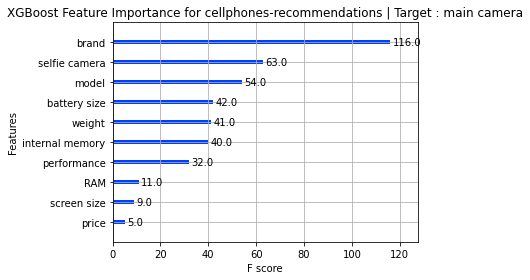

Target Variable: performance
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 10%|▉         | 4/42 [00:00<00:01, 20.07it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9761701056916587, 'Adjusted R-Squared': 0.9733481445235657, 'RMSE': 1.460398760201683, 'Time taken': 0.11878538131713867}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03653573989868164}
{'Model': 'BayesianRidge', 'R-Squared': 0.812134221036346, 'Adjusted R-Squared': 0.7898869577380185, 'RMSE': 4.100475641102756, 'Time taken': 0.037665605545043945}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02524590492248535}
{'Model': 'DummyRegressor', 'R-Squared': -0.013577183675091531, 'Adjusted R-Squared': -0.13360606068924707, 'RMSE': 9.52442596643401, 'Time taken': 0.02182459831237793}
{'Model': 'ElasticNet', 'R-Squared': 0.6338859184628276, 'Adjusted R-Squared': 0.590530303543952, 'RMSE': 5.724250280153591, 'Time taken': 0.04281330108642578}


 17%|█▋        | 7/42 [00:00<00:02, 16.13it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.810713547536639, 'Adjusted R-Squared': 0.7882980465870305, 'RMSE': 4.115950692805193, 'Time taken': 0.14966940879821777}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024315834045410156}


 26%|██▌       | 11/42 [00:00<00:02, 13.92it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.19962573051452637}
{'Model': 'GammaRegressor', 'R-Squared': 0.5892406519985965, 'Adjusted R-Squared': 0.5405980976300093, 'RMSE': 6.063231152326078, 'Time taken': 0.022558927536010742}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.966966958120038, 'Adjusted R-Squared': 0.9630551505289898, 'RMSE': 1.7194307190302103, 'Time taken': 0.08636331558227539}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9999173027821627, 'Adjusted R-Squared': 0.9999075096905767, 'RMSE': 0.08603117351717242, 'Time taken': 0.17009735107421875}


 36%|███▌      | 15/42 [00:01<00:03,  8.28it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999713563495769, 'Adjusted R-Squared': 0.9999679643383426, 'RMSE': 0.05063194138734083, 'Time taken': 0.3708815574645996}
{'Model': 'HuberRegressor', 'R-Squared': 0.8113517490933622, 'Adjusted R-Squared': 0.7890118246438919, 'RMSE': 4.1090061281193115, 'Time taken': 0.1303250789642334}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9980763728403214, 'Adjusted R-Squared': 0.9978485748872015, 'RMSE': 0.41492618944826615, 'Time taken': 0.04393577575683594}


 45%|████▌     | 19/42 [00:01<00:02, 10.94it/s]

{'Model': 'KernelRidge', 'R-Squared': -2.031513911850246, 'Adjusted R-Squared': -2.3905089803588275, 'RMSE': 16.471766618055472, 'Time taken': 0.05322885513305664}
{'Model': 'Lars', 'R-Squared': 0.8123540230323587, 'Adjusted R-Squared': 0.7901327889177696, 'RMSE': 4.0980761713409155, 'Time taken': 0.03752326965332031}
{'Model': 'LarsCV', 'R-Squared': 0.8102761296889271, 'Adjusted R-Squared': 0.7878088292573527, 'RMSE': 4.120703677896103, 'Time taken': 0.10439205169677734}
{'Model': 'Lasso', 'R-Squared': 0.681755953978955, 'Adjusted R-Squared': 0.6440691590554102, 'RMSE': 5.336918136135104, 'Time taken': 0.0333256721496582}


 50%|█████     | 21/42 [00:02<00:02,  9.80it/s]

{'Model': 'LassoCV', 'R-Squared': 0.8121400552635882, 'Adjusted R-Squared': 0.7898934828605921, 'RMSE': 4.10041196986747, 'Time taken': 0.20009136199951172}
{'Model': 'LassoLars', 'R-Squared': -0.013577183675091531, 'Adjusted R-Squared': -0.13360606068924707, 'RMSE': 9.52442596643401, 'Time taken': 0.0457916259765625}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8119629011906871, 'Adjusted R-Squared': 0.7896953500159001, 'RMSE': 4.102344881938682, 'Time taken': 0.1284806728363037}


 60%|█████▉    | 25/42 [00:02<00:01, 11.14it/s]

{'Model': 'LassoLarsIC', 'R-Squared': 0.8123540230323587, 'Adjusted R-Squared': 0.7901327889177696, 'RMSE': 4.0980761713409155, 'Time taken': 0.08423018455505371}
{'Model': 'LinearRegression', 'R-Squared': 0.8123540230323585, 'Adjusted R-Squared': 0.7901327889177694, 'RMSE': 4.098076171340917, 'Time taken': 0.04805445671081543}
{'Model': 'LinearSVR', 'R-Squared': 0.7920753185393332, 'Adjusted R-Squared': 0.7674526588926753, 'RMSE': 4.31383390917583, 'Time taken': 0.0556483268737793}


 64%|██████▍   | 27/42 [00:04<00:05,  2.97it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9306835152070267, 'Adjusted R-Squared': 0.922474984113122, 'RMSE': 2.4907415335398735, 'Time taken': 1.710343360900879}
{'Model': 'NuSVR', 'R-Squared': 0.9319492176438556, 'Adjusted R-Squared': 0.9238905723648385, 'RMSE': 2.467896594907196, 'Time taken': 0.0997922420501709}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5110912194383406, 'Adjusted R-Squared': 0.4531941270034072, 'RMSE': 6.614915731935661, 'Time taken': 0.024014711380004883}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7769248051369331, 'Adjusted R-Squared': 0.7505080057452541, 'RMSE': 4.468235328490788, 'Time taken': 0.038242340087890625}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.29277702666458383, 'Adjusted R-Squared': 0.20902693771696879, 'RMSE': 7.955886474960017, 'Time taken': 0.027234554290771484}


 74%|███████▍  | 31/42 [00:04<00:02,  5.07it/s]

{'Model': 'PoissonRegressor', 'R-Squared': 0.8079761631350214, 'Adjusted R-Squared': 0.785236498243116, 'RMSE': 4.145605473962916, 'Time taken': 0.04451632499694824}


 79%|███████▊  | 33/42 [00:11<00:09,  1.06s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.026631451357169045, 'Adjusted R-Squared': -0.1482062284915706, 'RMSE': 9.585564194179042, 'Time taken': 7.223248243331909}
{'Model': 'RANSACRegressor', 'R-Squared': 0.7893522210140086, 'Adjusted R-Squared': 0.7644070892919833, 'RMSE': 4.341990208103964, 'Time taken': 0.1455092430114746}


 90%|█████████ | 38/42 [00:12<00:02,  1.82it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.29061460494995117}
{'Model': 'Ridge', 'R-Squared': 0.8122572575404383, 'Adjusted R-Squared': 0.7900245643544376, 'RMSE': 4.099132685454858, 'Time taken': 0.01407313346862793}
{'Model': 'RidgeCV', 'R-Squared': 0.812257257540425, 'Adjusted R-Squared': 0.7900245643544227, 'RMSE': 4.099132685455002, 'Time taken': 0.032387495040893555}
{'Model': 'SGDRegressor', 'R-Squared': 0.8133358844064641, 'Adjusted R-Squared': 0.7912309233493349, 'RMSE': 4.0873404759618515, 'Time taken': 0.036899566650390625}
{'Model': 'SVR', 'R-Squared': 0.9341502364134393, 'Adjusted R-Squared': 0.9263522380939782, 'RMSE': 2.4276580153399436, 'Time taken': 0.0990598201751709}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8123540230323585, 'Adjusted R-Squared': 0.7901327889177694, 'RMSE': 4.098076171340917, 'Time taken': 0.017720937728881836}
{'Model': 'TweedieRegressor', 'R-Squared': 0.6160427396528678

100%|██████████| 42/42 [00:12<00:00,  3.25it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999998383576, 'Adjusted R-Squared': 0.9999999998192157, 'RMSE': 0.00012027849, 'Time taken': 0.5345852375030518}
{'Model': 'LGBMRegressor', 'R-Squared': 0.999969355210093, 'Adjusted R-Squared': 0.9999657262218146, 'RMSE': 0.05237074134068309, 'Time taken': 0.18242907524108887}
Project: cellphones-recommendations
cellphones-recommendations
Target: performance
performance
Target Standard Deviation: 8.949554925284954
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.03
RandomForestRegressor                        1.00       1.00  0.00        0.29
BaggingRegressor                             1.00       1.00  0.00        0.04
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00       1.00  0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1      32      32.00
2      17      17.00
3      31      31.00
4      14      14.00
XGBoost RMSE:  0.00012027849


<Figure size 432x288 with 0 Axes>

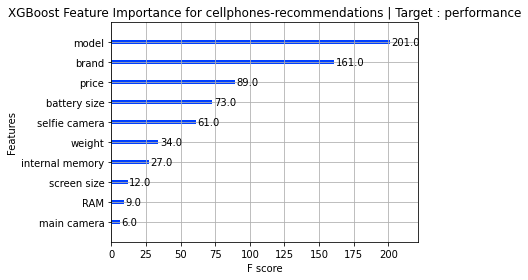

Target Variable: RAM
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


  7%|▋         | 3/42 [00:00<00:01, 26.41it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9698669604804331, 'Adjusted R-Squared': 0.966298574221537, 'RMSE': 0.2068193954054217, 'Time taken': 0.05109000205993652}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.037607669830322266}
{'Model': 'BayesianRidge', 'R-Squared': 0.9173992556516446, 'Adjusted R-Squared': 0.9076175885577604, 'RMSE': 0.34242209032917714, 'Time taken': 0.024623394012451172}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0447390079498291}
{'Model': 'DummyRegressor', 'R-Squared': -0.0007965331984196578, 'Adjusted R-Squared': -0.1193119121298114, 'RMSE': 1.1919078766024234, 'Time taken': 0.05376625061035156}
{'Model': 'ElasticNet', 'R-Squared': 0.3440585157090349, 'Adjusted R-Squared': 0.2663812346745785, 'RMSE': 0.9649445170930812, 'Time taken': 0.04214835166931152}


 14%|█▍        | 6/42 [00:00<00:01, 22.94it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.9170625684835755, 'Adjusted R-Squared': 0.907241030540841, 'RMSE': 0.3431192503954281, 'Time taken': 0.16793417930603027}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02653789520263672}


 26%|██▌       | 11/42 [00:00<00:02, 11.67it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.20365047454833984}
{'Model': 'GammaRegressor', 'R-Squared': 0.7281614450147472, 'Adjusted R-Squared': 0.6959700371875462, 'RMSE': 0.6211912362906586, 'Time taken': 0.02103424072265625}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9790435155869206, 'Adjusted R-Squared': 0.9765618266432664, 'RMSE': 0.1724761335817686, 'Time taken': 0.15137124061584473}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9999417339087844, 'Adjusted R-Squared': 0.99993483397693, 'RMSE': 0.009094477144031434, 'Time taken': 0.19401144981384277}


 38%|███▊      | 16/42 [00:01<00:03,  7.64it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9999976833454549, 'Adjusted R-Squared': 0.9999974090047851, 'RMSE': 0.001813428481314595, 'Time taken': 0.6021950244903564}
{'Model': 'HuberRegressor', 'R-Squared': 0.9084842648200596, 'Adjusted R-Squared': 0.8976468751276983, 'RMSE': 0.360427301317764, 'Time taken': 0.06646013259887695}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9991760624457936, 'Adjusted R-Squared': 0.9990784908933218, 'RMSE': 0.034199278402838464, 'Time taken': 0.027595043182373047}
{'Model': 'KernelRidge', 'R-Squared': -5.972320794278847, 'Adjusted R-Squared': -6.797990362022395, 'RMSE': 3.1459982301368226, 'Time taken': 0.06511306762695312}


 43%|████▎     | 18/42 [00:01<00:02,  8.73it/s]

{'Model': 'Lars', 'R-Squared': 0.9173984184718863, 'Adjusted R-Squared': 0.9076166522382939, 'RMSE': 0.34242382559269535, 'Time taken': 0.06370306015014648}
{'Model': 'LarsCV', 'R-Squared': 0.916690157166136, 'Adjusted R-Squared': 0.9068245178831784, 'RMSE': 0.3438887363054593, 'Time taken': 0.07209134101867676}
{'Model': 'Lasso', 'R-Squared': -0.0007965331984196578, 'Adjusted R-Squared': -0.1193119121298114, 'RMSE': 1.1919078766024234, 'Time taken': 0.04185318946838379}


 52%|█████▏    | 22/42 [00:02<00:01, 10.29it/s]

{'Model': 'LassoCV', 'R-Squared': 0.9168369845780151, 'Adjusted R-Squared': 0.9069887327517274, 'RMSE': 0.343585563485398, 'Time taken': 0.1867527961730957}
{'Model': 'LassoLars', 'R-Squared': -0.0007965331984196578, 'Adjusted R-Squared': -0.1193119121298114, 'RMSE': 1.1919078766024234, 'Time taken': 0.024356365203857422}
{'Model': 'LassoLarsCV', 'R-Squared': 0.916690157166136, 'Adjusted R-Squared': 0.9068245178831784, 'RMSE': 0.3438887363054593, 'Time taken': 0.079376220703125}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9169593226946706, 'Adjusted R-Squared': 0.9071255582769342, 'RMSE': 0.34333275230216415, 'Time taken': 0.038960933685302734}
{'Model': 'LinearRegression', 'R-Squared': 0.917398418471886, 'Adjusted R-Squared': 0.9076166522382936, 'RMSE': 0.34242382559269585, 'Time taken': 0.022899866104125977}


 60%|█████▉    | 25/42 [00:02<00:01, 12.27it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.9089825154445886, 'Adjusted R-Squared': 0.8982041291156584, 'RMSE': 0.3594448023680224, 'Time taken': 0.09903192520141602}


 64%|██████▍   | 27/42 [00:04<00:04,  3.57it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9906025594831728, 'Adjusted R-Squared': 0.9894897046851274, 'RMSE': 0.11549803256284076, 'Time taken': 1.4746949672698975}
{'Model': 'NuSVR', 'R-Squared': 0.9986769208069285, 'Adjusted R-Squared': 0.99852024037617, 'RMSE': 0.0433373861250107, 'Time taken': 0.18115472793579102}


 74%|███████▍  | 31/42 [00:04<00:01,  5.77it/s]

{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.509015708374923, 'Adjusted R-Squared': 0.4508728317351113, 'RMSE': 0.8348406594907509, 'Time taken': 0.027860164642333984}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.8742908799030138, 'Adjusted R-Squared': 0.8594042735757391, 'RMSE': 0.42242847649679327, 'Time taken': 0.04016566276550293}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.8599154056359685, 'Adjusted R-Squared': 0.843326440513912, 'RMSE': 0.44592824576547324, 'Time taken': 0.026062965393066406}
{'Model': 'PoissonRegressor', 'R-Squared': 0.8172324097801308, 'Adjusted R-Squared': 0.7955888793593568, 'RMSE': 0.5093536076218819, 'Time taken': 0.03290200233459473}


 79%|███████▊  | 33/42 [00:11<00:09,  1.03s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.021682566032247053, 'Adjusted R-Squared': -0.1426712909571184, 'RMSE': 1.2042808625817003, 'Time taken': 7.575978755950928}
{'Model': 'RANSACRegressor', 'R-Squared': 0.909347618075677, 'Adjusted R-Squared': 0.8986124675846388, 'RMSE': 0.35872314918878667, 'Time taken': 0.06606769561767578}


 90%|█████████ | 38/42 [00:12<00:02,  1.84it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.2706568241119385}
{'Model': 'Ridge', 'R-Squared': 0.9173992730985251, 'Adjusted R-Squared': 0.9076176080707189, 'RMSE': 0.34242205416607946, 'Time taken': 0.016422510147094727}
{'Model': 'RidgeCV', 'R-Squared': 0.9173992730984007, 'Adjusted R-Squared': 0.9076176080705798, 'RMSE': 0.3424220541663371, 'Time taken': 0.03040146827697754}
{'Model': 'SGDRegressor', 'R-Squared': 0.9133474114928537, 'Adjusted R-Squared': 0.9030859207485864, 'RMSE': 0.35072002541197955, 'Time taken': 0.024329185485839844}
{'Model': 'SVR', 'R-Squared': 0.9937203582075879, 'Adjusted R-Squared': 0.9929767164163812, 'RMSE': 0.09441418078647457, 'Time taken': 0.0928342342376709}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.917398418471886, 'Adjusted R-Squared': 0.9076166522382936, 'RMSE': 0.34242382559269585, 'Time taken': 0.020013093948364258}
{'Model': 'TweedieRegressor', 'R-Squared': 0.7519938686

100%|██████████| 42/42 [00:12<00:00,  3.25it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999922472577, 'Adjusted R-Squared': 0.9999999913291697, 'RMSE': 0.00010490531, 'Time taken': 0.4728353023529053}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9999976656397175, 'Adjusted R-Squared': 0.9999973892023156, 'RMSE': 0.0018203451303872267, 'Time taken': 0.07925224304199219}
Project: cellphones-recommendations
cellphones-recommendations
Target: RAM
RAM
Target Standard Deviation: 1.2526254019974272
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.04
RandomForestRegressor                        1.00       1.00  0.00        0.27
ExtraTreeRegressor                           1.00       1.00  0.00        0.03
ExtraTreesRegressor                          1.00       1.00  0.00        0.20
BaggingRegressor                             1.00       1.00  0.00        0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       5       5.00
1       1       1.00
2       4       4.00
3       4       4.00
4       2       2.00
XGBoost RMSE:  0.00010490531


<Figure size 432x288 with 0 Axes>

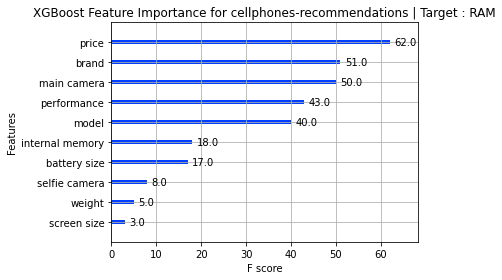

Target Variable: internal memory
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 12%|█▏        | 5/42 [00:00<00:01, 25.57it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9980815100481472, 'Adjusted R-Squared': 0.9978543204485857, 'RMSE': 0.038612333123965906, 'Time taken': 0.11590957641601562}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03412580490112305}
{'Model': 'BayesianRidge', 'R-Squared': 0.8708813676636329, 'Adjusted R-Squared': 0.8555910033080105, 'RMSE': 0.31676758859056, 'Time taken': 0.023308515548706055}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.023228883743286133}
{'Model': 'DummyRegressor', 'R-Squared': -0.0015842281288502846, 'Adjusted R-Squared': -0.12019288672305617, 'RMSE': 0.8822466510243793, 'Time taken': 0.02036881446838379}
{'Model': 'ElasticNet', 'R-Squared': 0.27135594321899936, 'Adjusted R-Squared': 0.18506914702124921, 'RMSE': 0.7524956493865788, 'Time taken': 0.02245616912841797}


 19%|█▉        | 8/42 [00:00<00:01, 19.28it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.8705790400390274, 'Adjusted R-Squared': 0.8552528737278596, 'RMSE': 0.3171382229333201, 'Time taken': 0.1473679542541504}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.024991750717163086}


 26%|██▌       | 11/42 [00:00<00:02, 14.07it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.18780207633972168}
{'Model': 'GammaRegressor', 'R-Squared': 0.7083766465071072, 'Adjusted R-Squared': 0.6738423020145278, 'RMSE': 0.47605532763444175, 'Time taken': 0.022422313690185547}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9336072110328427, 'Adjusted R-Squared': 0.9257449070762057, 'RMSE': 0.2271468592113717, 'Time taken': 0.08513855934143066}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9999911981440274, 'Adjusted R-Squared': 0.999990155818978, 'RMSE': 0.0026153716321152347, 'Time taken': 0.1739506721496582}


 38%|███▊      | 16/42 [00:01<00:02, 11.77it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.999999041388451, 'Adjusted R-Squared': 0.9999989278686623, 'RMSE': 0.000863112901580427, 'Time taken': 0.24768924713134766}
{'Model': 'HuberRegressor', 'R-Squared': 0.8445702610450836, 'Adjusted R-Squared': 0.8261641077477908, 'RMSE': 0.34754683566752287, 'Time taken': 0.0547785758972168}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9975919732441472, 'Adjusted R-Squared': 0.9973068121809541, 'RMSE': 0.04325904563487002, 'Time taken': 0.02881789207458496}
{'Model': 'KernelRidge', 'R-Squared': -10.020899325001132, 'Adjusted R-Squared': -11.326005824014423, 'RMSE': 2.9265422443436733, 'Time taken': 0.0413508415222168}
{'Model': 'Lars', 'R-Squared': 0.8711389087838732, 'Adjusted R-Squared': 0.8558790427188055, 'RMSE': 0.3164515172415032, 'Time taken': 0.027953624725341797}


 45%|████▌     | 19/42 [00:01<00:01, 14.41it/s]

{'Model': 'LarsCV', 'R-Squared': 0.8711389087838732, 'Adjusted R-Squared': 0.8558790427188055, 'RMSE': 0.3164515172415032, 'Time taken': 0.06284475326538086}
{'Model': 'Lasso', 'R-Squared': -0.0015842281288502846, 'Adjusted R-Squared': -0.12019288672305617, 'RMSE': 0.8822466510243793, 'Time taken': 0.02377796173095703}
{'Model': 'LassoCV', 'R-Squared': 0.8707235245456966, 'Adjusted R-Squared': 0.8554144682418975, 'RMSE': 0.3169611482324835, 'Time taken': 0.16468071937561035}


 55%|█████▍    | 23/42 [00:01<00:01, 14.24it/s]

{'Model': 'LassoLars', 'R-Squared': -0.0015842281288502846, 'Adjusted R-Squared': -0.12019288672305617, 'RMSE': 0.8822466510243793, 'Time taken': 0.02496957778930664}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8711389087838732, 'Adjusted R-Squared': 0.8558790427188055, 'RMSE': 0.3164515172415032, 'Time taken': 0.05831336975097656}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8711389087838732, 'Adjusted R-Squared': 0.8558790427188055, 'RMSE': 0.3164515172415032, 'Time taken': 0.04068636894226074}
{'Model': 'LinearRegression', 'R-Squared': 0.8711389087838726, 'Adjusted R-Squared': 0.8558790427188048, 'RMSE': 0.31645151724150405, 'Time taken': 0.047402143478393555}


 60%|█████▉    | 25/42 [00:01<00:01, 14.05it/s]

{'Model': 'LinearSVR', 'R-Squared': 0.7914815312704042, 'Adjusted R-Squared': 0.7667885547103205, 'RMSE': 0.4025488065450076, 'Time taken': 0.09047222137451172}
{'Model': 'MLPRegressor', 'R-Squared': 0.9839733497946754, 'Adjusted R-Squared': 0.9820754570072028, 'RMSE': 0.11160089024767193, 'Time taken': 1.2330951690673828}


 74%|███████▍  | 31/42 [00:03<00:01,  6.37it/s]

{'Model': 'NuSVR', 'R-Squared': 0.9986786528276315, 'Adjusted R-Squared': 0.9985221775045878, 'RMSE': 0.032044592246383875, 'Time taken': 0.24108481407165527}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5830831678615848, 'Adjusted R-Squared': 0.5337114377399303, 'RMSE': 0.5692079989716161, 'Time taken': 0.022915124893188477}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7875530724036715, 'Adjusted R-Squared': 0.7623948836093694, 'RMSE': 0.40632309441307546, 'Time taken': 0.038614749908447266}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.8268908768231139, 'Adjusted R-Squared': 0.8063911122363774, 'RMSE': 0.3667805168981303, 'Time taken': 0.02665233612060547}
{'Model': 'PoissonRegressor', 'R-Squared': 0.7652184145535799, 'Adjusted R-Squared': 0.7374153320665038, 'RMSE': 0.4271479195258274, 'Time taken': 0.030911684036254883}
{'Model': 'QuantileRegressor', 'R-Squared': -0.01588628762955424, 'Adjusted R-Squared': -0.1361886111646331, 'RMSE': 0.8885233166404474

 79%|███████▊  | 33/42 [00:10<00:08,  1.00it/s]

{'Model': 'RANSACRegressor', 'R-Squared': 0.14605857894616936, 'Adjusted R-Squared': 0.044933936979268285, 'RMSE': 0.8146298503612933, 'Time taken': 0.22878789901733398}


 90%|█████████ | 38/42 [00:11<00:02,  1.94it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.26076436042785645}
{'Model': 'Ridge', 'R-Squared': 0.8708772318843865, 'Adjusted R-Squared': 0.8555863777654322, 'RMSE': 0.316772661717128, 'Time taken': 0.017754554748535156}
{'Model': 'RidgeCV', 'R-Squared': 0.870877231884339, 'Adjusted R-Squared': 0.8555863777653792, 'RMSE': 0.31677266171718627, 'Time taken': 0.029883623123168945}
{'Model': 'SGDRegressor', 'R-Squared': 0.8577150967832465, 'Adjusted R-Squared': 0.8408655687707363, 'RMSE': 0.3325260636501323, 'Time taken': 0.02436375617980957}
{'Model': 'SVR', 'R-Squared': 0.9892345279981862, 'Adjusted R-Squared': 0.9879596694716557, 'RMSE': 0.09146665939994958, 'Time taken': 0.07058167457580566}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8711389087838726, 'Adjusted R-Squared': 0.8558790427188048, 'RMSE': 0.31645151724150405, 'Time taken': 0.023259639739990234}
{'Model': 'TweedieRegressor', 'R-Squared': 0.7121186915

100%|██████████| 42/42 [00:11<00:00,  3.59it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999999954536212, 'Adjusted R-Squared': 0.9999999949152342, 'RMSE': 5.944004e-05, 'Time taken': 0.46706128120422363}
{'Model': 'LGBMRegressor', 'R-Squared': 0.999999041181859, 'Adjusted R-Squared': 0.9999989276376055, 'RMSE': 0.0008632059020250325, 'Time taken': 0.07643556594848633}
Project: cellphones-recommendations
cellphones-recommendations
Target: internal memory
internal memory
Target Standard Deviation: 0.8918464186958102
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
DecisionTreeRegressor                        1.00       1.00  0.00        0.02
RandomForestRegressor                        1.00       1.00  0.00        0.26
BaggingRegressor                             1.00       1.00  0.00        0.03
ExtraTreeRegressor                           1.00       1.00  0.00        0.02
ExtraTreesRegressor                          1.00   

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost Predictions vs Actual==========
   actual  predicted
0       4       4.00
1       3       3.00
2       4       4.00
3       3       3.00
4       4       4.00
XGBoost RMSE:  5.944004e-05


<Figure size 432x288 with 0 Axes>

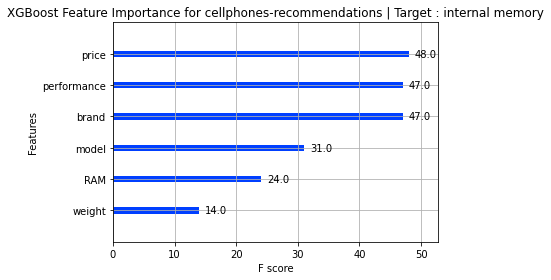

Target Variable: operating system
CATS=====================
['rating', 'brand', 'model', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['release date', 'gender']
16
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'model', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'release date_na', 'gender_na']
Tabular Object size: 855


 67%|██████▋   | 28/42 [00:00<00:00, 135.08it/s]

AdaBoostRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BaggingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BayesianRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DecisionTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DummyRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNet model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNetCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreesRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype

100%|██████████| 42/42 [00:00<00:00, 130.85it/s]

OrthogonalMatchingPursuitCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
PassiveAggressiveRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
PoissonRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
QuantileRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RANSACRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RandomForestRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Ridge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RidgeCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
SGDRegressor model failed to execute
Input contains NaN, infinity or a value too large for

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost failed
Target Variable: model
CATS=====================
['rating', 'brand', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation']
CONTS=====================
['operating system', 'release date', 'gender']
16
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['operating system', 'release date', 'gender']
Categorical variables that made the cut : ['rating', 'brand', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'age', 'occupation', 'operating system_na', 'release date_na', 'gender_na']
Tabular Object size: 855


 31%|███       | 13/42 [00:00<00:00, 125.23it/s]

AdaBoostRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BaggingRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
BayesianRidge model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DecisionTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
DummyRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNet model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ElasticNetCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreeRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
ExtraTreesRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype

 93%|█████████▎| 39/42 [00:00<00:00, 124.52it/s]

NuSVR model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
OrthogonalMatchingPursuit model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
OrthogonalMatchingPursuitCV model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
PassiveAggressiveRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
PoissonRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
QuantileRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RANSACRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
RandomForestRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
Ridge model failed to execute
Input contains NaN, infinity or a value to

100%|██████████| 42/42 [00:00<00:00, 121.66it/s]

TweedieRegressor model failed to execute
Input contains NaN, infinity or a value too large for dtype('float64').
XGBRegressor model failed to execute
[02:49:44] ../src/data/data.cc:458: Check failed: valid: Label contains NaN, infinity or a value too large.
Stack trace:
  [bt] (0) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x16b9c9) [0x7fb6a79599c9]
  [bt] (1) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x178eb6) [0x7fb6a7966eb6]
  [bt] (2) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(+0x179d10) [0x7fb6a7967d10]
  [bt] (3) /opt/conda/lib/python3.7/site-packages/xgboost/lib/libxgboost.so(XGDMatrixSetInfoFromInterface+0xa4) [0x7fb6a78aa754]
  [bt] (4) /opt/conda/lib/python3.7/lib-dynload/../../libffi.so.8(+0x6a4a) [0x7fb71e970a4a]
  [bt] (5) /opt/conda/lib/python3.7/lib-dynload/../../libffi.so.8(+0x5fea) [0x7fb71e96ffea]
  [bt] (6) /opt/conda/lib/python3.7/lib-dynload/_ctypes.cpython-37m-x86_64-linux-gnu.so(_ctypes_callproc

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 281, in <module>
    learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
  File "/opt/conda/lib/python3.7/site-packages/fastai/callback/schedule.py", line 119, in fit_one_cycle
    self.fit(n_epoch, cbs=ParamScheduler(scheds)+L(cbs), reset_opt=reset_opt, wd=wd, start_epoch=start_epoch)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 256, in fit
    self._with_events(self._do_fit, 'fit', CancelFitException, self._end_cleanup)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 245, in _do_fit
    self._with_events(self._do_epoch, 'epoch', CancelEpochException)
  File "/opt/conda/lib/python3.7/site-packages/fastai/learner.py", line 193, in _with_events
    try: self(f'before_{event_type}');  f()
  File "/opt/conda/lib/python3.7/site-pa

Could not fit model
XGBoost failed
Target Variable: brand
CATS=====================
['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'gender', 'occupation']
CONTS=====================
[]
17
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : []
Categorical variables that made the cut : ['rating', 'brand', 'model', 'operating system', 'internal memory', 'RAM', 'performance', 'main camera', 'selfie camera', 'battery size', 'screen size', 'weight', 'price', 'release date', 'age', 'gender', 'occupation']
Tabular Object size: 855


  0%|          | 0/42 [00:00<?, ?it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01520681381225586}
{'Model': 'BaggingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02811145782470703}
{'Model': 'BayesianRidge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.019730806350708008}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.023469924926757812}


 12%|█▏        | 5/42 [00:00<00:00, 45.22it/s]

{'Model': 'DummyRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.022634029388427734}
{'Model': 'ElasticNet', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.044000864028930664}


 24%|██▍       | 10/42 [00:00<00:02, 14.05it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.28844571113586426}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.022515296936035156}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.15428447723388672}
{'Model': 'GammaRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015795230865478516}


 31%|███       | 13/42 [00:00<00:02, 13.50it/s]

{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 0.07520083091907856, 'Time taken': 0.08773112297058105}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.07495665550231934}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.07390308380126953}


 40%|████      | 17/42 [00:01<00:01, 15.26it/s]

{'Model': 'HuberRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 6.740344150095168e-11, 'Time taken': 0.07384777069091797}
{'Model': 'KNeighborsRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.0261993408203125}
{'Model': 'KernelRidge', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 0.9999999999999876, 'Time taken': 0.06174302101135254}
{'Model': 'Lars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04605722427368164}
LarsCV model failed to execute
x and y arrays must have at least 2 entries


 45%|████▌     | 19/42 [00:01<00:01, 16.08it/s]

{'Model': 'Lasso', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.06293797492980957}


 57%|█████▋    | 24/42 [00:01<00:01, 13.61it/s]

{'Model': 'LassoCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.27719855308532715}
{'Model': 'LassoLars', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03529715538024902}
LassoLarsCV model failed to execute
x and y arrays must have at least 2 entries
{'Model': 'LassoLarsIC', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05604887008666992}
{'Model': 'LinearRegression', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.046647071838378906}
{'Model': 'LinearSVR', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 5.295809082316437e-09, 'Time taken': 0.04909467697143555}


 71%|███████▏  | 30/42 [00:02<00:00, 12.51it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 0.07486381145325152, 'Time taken': 0.4396688938140869}
{'Model': 'NuSVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03681802749633789}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.022388219833374023}
OrthogonalMatchingPursuitCV model failed to execute
attempt to get argmin of an empty sequence
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 0.04300745720814242, 'Time taken': 0.022861719131469727}
{'Model': 'PoissonRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.022703170776367188}


 79%|███████▊  | 33/42 [00:07<00:05,  1.79it/s]

{'Model': 'QuantileRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 1.4210854715202004e-14, 'Time taken': 4.734684944152832}
{'Model': 'RANSACRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.05020499229431152}


 93%|█████████▎| 39/42 [00:07<00:00,  3.46it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.22313809394836426}
{'Model': 'Ridge', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.015539169311523438}
{'Model': 'RidgeCV', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03272509574890137}
{'Model': 'SGDRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 0.0013817058212158095, 'Time taken': 0.022226333618164062}
{'Model': 'SVR', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02552008628845215}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.04396414756774902}
{'Model': 'TweedieRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.03645133972167969}


100%|██████████| 42/42 [00:08<00:00,  5.08it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.0, 'Adjusted R-Squared': -0.10389610389610393, 'RMSE': 5.9604645e-08, 'Time taken': 0.7386643886566162}
{'Model': 'LGBMRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.02704024314880371}
Project: cellphones-recommendations
cellphones-recommendations
Target: brand
brand
Target Standard Deviation: 0.0
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
AdaBoostRegressor                            1.00       1.00  0.00        0.02
Lasso                                        1.00       1.00  0.00        0.06
TweedieRegressor                             1.00       1.00  0.00        0.04
TransformedTargetRegressor                   1.00       1.00  0.00        0.04
SVR                                          1.00       1.00  0.00        0.03
RidgeCV                                      1.00       1.00  0.00  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,4.776519,0.171696,0.414362,00:00
1,3.328281,0.217735,0.466621,00:00


Better model found at epoch 0 with _rmse value: 0.4143620431423187.
No improvement since epoch 0: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.00
1       1       1.00
2       1       1.00
3       1       1.00
4       1       1.00
XGBoost RMSE:  5.9604645e-08
XGBoost failed


Traceback (most recent call last):
  File "/tmp/ipykernel_20/2755408106.py", line 310, in <module>
    plot_importance(xgb)
  File "/opt/conda/lib/python3.7/site-packages/xgboost/plotting.py", line 75, in plot_importance
    'Booster.get_score() results in empty.  ' +
ValueError: Booster.get_score() results in empty.  This maybe caused by having all trees as decision dumps.


<Figure size 432x288 with 0 Axes>

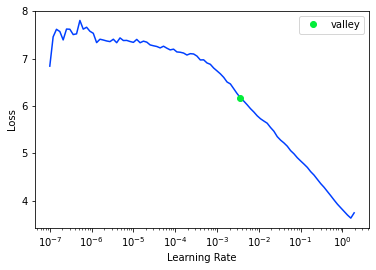

<Figure size 720x720 with 0 Axes>

In [22]:
target = ''
target_str = ''
#The column closest to the end isPARAM_DIR the target variable that can be represented as a float is the target variable
targets = []
#Loop through every possible target column (Continuous)
for i in range(len(df.columns)-1, 0, -1):
    try:
        df[df.columns[i]] = df[df.columns[i]].apply(pd.to_numeric, errors='coerce').dropna()
        target = df.columns[i]
        target_str = target.replace('/', '-')
    except:
        continue
    print(f'Target Variable: {target}')
    #Will be determined by the file name


    #===================================================================================================

    #Create project config files if they don't exist.
    if not os.path.exists(param_dir):
        #create param_dir
        os.makedirs(PARAM_DIR)
    if not os.path.exists(f'{PARAM_DIR}/cats.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/cats.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/conts.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/conts.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/cols_to_delete.txt'):
        with open(f'{PARAM_DIR}/cols_to_delete.txt', 'w') as f:
            f.write('')

    df = df.drop_duplicates()
    if SHUFFLE_DATA:
        df = df.sample(frac=1).reset_index(drop=True)

    # workaround for fastai/pytorch bug where bool is treated as object and thus erroring out.
    for n in df:
        if pd.api.types.is_bool_dtype(df[n]):
            df[n] = df[n].astype('uint8')

    with open(f'{PARAM_DIR}/cols_to_delete.txt', 'r') as f:
        cols_to_delete = f.read().splitlines()
    for col in cols_to_delete:
        try:
            del(df[col])
        except:
            pass
    #try to fill in missing values now, otherwise FastAI will do it for us later
    try:
        df = df.fillna(0)
    except:
        pass
    #print missing values
    #print(df.isna().sum().sort_values(ascending=False))
    #shrink df as much as possible
    df = df_shrink(df)


    #print types inside of df
    #print(df.dtypes)


    #Auto detect categorical and continuous variables
    #==============================================================================
    likely_cat = {}
    for var in df.columns:
        likely_cat[var] = 1.*df[var].nunique()/df[var].count() < 0.05 #or some other threshold

    cats = [var for var in df.columns if likely_cat[var]]
    conts = [var for var in df.columns if not likely_cat[var]]

    #remove target from lists
    try:
        conts.remove(target)
        cats.remove(target)
    except:
        pass
    #Convert target to float
    df[target] = df[target].apply(pd.to_numeric, errors='coerce').dropna()

    print('CATS=====================')
    print(cats)
    print('CONTS=====================')
    print(conts)

    #Populate categorical and continuous lists
    #==============================================================================

    if VARIABLE_FILES == True:
        with open(f'{PARAM_DIR}/cats.txt', 'r') as f:
            cats = f.read().splitlines()

        with open(f'{PARAM_DIR}/conts.txt', 'r') as f:
            conts = f.read().splitlines()

    #==============================================================================

    #==============================================================================
    procs = [Categorify, FillMissing, Normalize]
    #print(df.describe().T)
    df = df[0:SAMPLE_COUNT]
    splits = RandomSplitter()(range_of(df))

    print((len(cats)) + len(conts))
    #conts = []

    #Convert cont variables to floats
    #==============================================================================

    #Convert cont variables to floats
    #==============================================================================

    for var in conts:
        try:
            df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
        except:
            print(f'Could not convert {var} to float.')
            pass

    #==============================================================================

    #Experimental logic to add columns one-by-one to find a breakpoint
    #==============================================================================
    if ENABLE_BREAKPOINT == True:
        temp_procs = [Categorify, FillMissing]
        print('Looping through continuous variables to find breakpoint')
        cont_list = []
        for cont in conts:
            focus_cont = cont
            cont_list.append(cont)
            #print(focus_cont)
            try:
                to = TabularPandas(df, procs=procs, cat_names=cats, cont_names=cont_list, y_names=target, y_block=RegressionBlock(), splits=splits)
                del(to)
            except:
                print('Error with ', focus_cont)
                #remove focus_cont from list
                cont_list.remove(focus_cont)
                #traceback.print_exc()
                continue
        #convert all continuous variables to floats
        for var in cont_list:
            try:
                df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
            except:
                print(f'Could not convert {var} to float.')
                cont_list.remove(var)
                if CONVERT_TO_CAT == True:
                    cats.append(var)
                pass
        print(f'Continuous variables that made the cut : {cont_list}')
        print(f'Categorical variables that made the cut : {cats}')
        #shrink df as much as possible
        df = df_shrink(df)
        #print(df.dtypes)

    #==============================================================================

    #Creating tabular object + quick preprocessing
    #==============================================================================
    to = None
    if REGRESSOR == True:
        try:
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
    else:
        try:
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)

    #print(dir(to))
    #print(to.xs)
    dls = to.dataloaders()
    print(f'Tabular Object size: {len(to)}')
    try:
        dls.one_batch()
    except:
        print(f'problem with getting one batch of {PROJECT_NAME}')
    #==============================================================================

    #Extracting train and test sets from tabular object
    #==============================================================================

    X_train, y_train = to.train.xs, to.train.ys.values.ravel()
    X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

    #Make sure target isn't in independent columns
    if target in X_train and target in X_test:
        del(X_train[target])
        del(X_test[target])
    #create dataframe from X_train and y_train
    #export tabular object to csv
    pd.DataFrame(X_train).to_csv(f'{PARAM_DIR}/X_train_{target_str}.csv', index=False)
    pd.DataFrame(X_test).to_csv(f'{PARAM_DIR}/X_test_{target_str}.csv', index=False)
    pd.DataFrame(y_train).to_csv(f'{PARAM_DIR}/y_train_{target_str}.csv', index=False)
    pd.DataFrame(y_test).to_csv(f'{PARAM_DIR}/y_test_{target_str}.csv', index=False)

    #==============================================================================

    #==============================================================================

    #Ready for model selection!

    if REGRESSOR == True:
        try:
            reg = LazyRegressor(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = reg.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            target_std = y_train.std()
            print(f'Target Standard Deviation: {target_std}')
            print(models)
            models['project'] = PROJECT_NAME
            models['target'] = target
            models['target_std'] = target_std
            #rename index of 
            models.to_csv(f'{PARAM_DIR}/regression_results_{target_str}.csv', mode='a', header=True, index=True)
        except:
            print('Issue during lazypredict analysis')
    else:
        #TODO: remove this
        try:
            clf = LazyClassifier(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = clf.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            print(f'Target Standard Deviation: {y_train.std()}')
            print(models)
            models.to_csv(f'{PARAM_DIR}/classification_results.csv', mode='a', header=False)
        except:
            print('Issue during lazypredict analysis')

    model_name = 'tabnet'

    # FastAI + pre-trained TabNet
    #==============================================================================
    learn = None
    i = 0
    while True:
        try:
            del learn
        except:
            pass
        try:
            learn = 0
            model = TabNetModel(get_emb_sz(to), len(to.cont_names), dls.c, n_d=64, n_a=64, n_steps=5, virtual_batch_size=256)
            # save the best model so far, determined by early stopping
            cbs = [SaveModelCallback(monitor='_rmse', comp=np.less, fname=f'{model_name}_{PROJECT_NAME}_{target_str}_best'), EarlyStoppingCallback()]
            learn = Learner(dls, model, loss_func=MSELossFlat(), metrics=rmse, cbs=cbs)
            #learn = get_learner(to)
            if(learn != 0):
                break
            if i > 50:
                break
        except:
            i += 1
            print('Error in FastAI TabNet')
            traceback.print_exc()
            continue
    try:
        #display learning rate finder results
        x = learn.lr_find()
    except:
        pass
    if AUTO_ADJUST_LEARNING_RATE == True:
        FASTAI_LEARNING_RATE = x.valley
    print(f'LEARNING RATE: {FASTAI_LEARNING_RATE}')
    try:
        if i < 50:
            learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
            plt.figure(figsize=(10, 10))
            try:
                ax = learn.show_results()
                plt.show(block=True)
            except:
                print('Could not show results')
                pass
    except:
        print('Could not fit model')
        traceback.print_exc()
        pass

    #==============================================================================

    #fit an xgboost model
    #==============================================================================
    if REGRESSOR == True:
        xgb = XGBRegressor()
    else:
        xgb = XGBClassifier()
    try:
        xgb = XGBRegressor()
        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)
        print('XGBoost Predictions vs Actual==========')
        print(pd.DataFrame({'actual': y_test, 'predicted': y_pred}).head())
        print('XGBoost RMSE: ', np.sqrt(mean_squared_error(y_test, y_pred)))
        #save feature importance plot to file
        plot_importance(xgb)
        plt.title(f'XGBoost Feature Importance for {PROJECT_NAME} | Target : {target}', wrap=True)
        plt.tight_layout()
        plt.show()
        plt.savefig(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.png')
        fi_df = pd.DataFrame([xgb.get_booster().get_score()]).T
        fi_df.columns = ['importance']
        #create a column based off the index called feature
        fi_df['feature'] = fi_df.index
        #create a dataframe of feature importance
        fi_df = fi_df[['feature', 'importance']]
        fi_df.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv', index=False)
        #xgb_fi = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=['importance'])
        #xgb_fi.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv')
        #print('XGBoost AUC: ', roc_auc_score(y_test, y_pred))
    except:
        traceback.print_exc()
        print('XGBoost failed')

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Overall Feature Importance**</div>

           feature  importance
0            brand      127.00
1            model       92.00
2  internal memory       13.00
3              RAM       25.00
4      performance       84.00


<AxesSubplot:title={'center':'XGBoost Overall Feature Importance'}, xlabel='feature'>

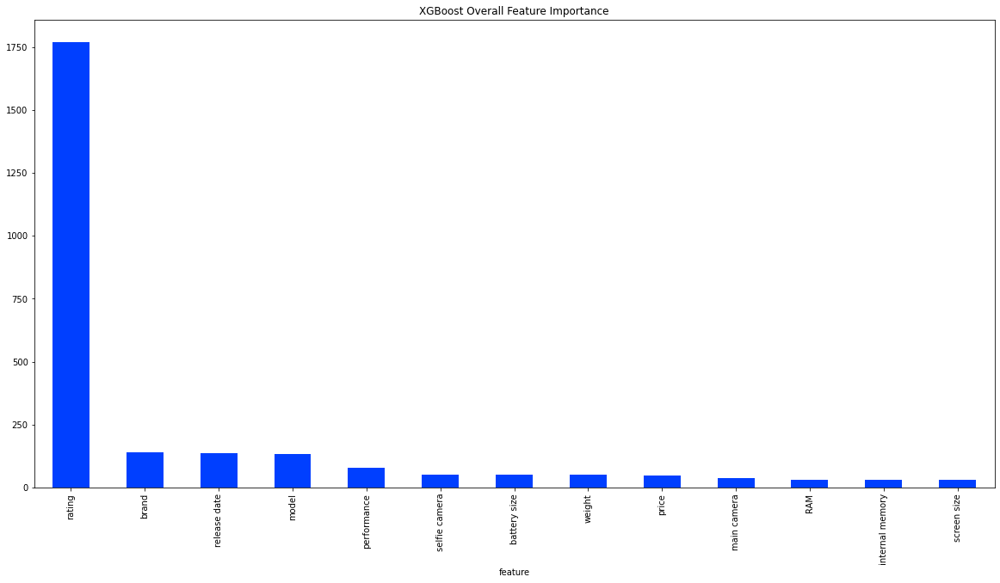

In [23]:
out_dir = f'./{PROJECT_NAME}'
xgb_feature_importance_csvs = []

for file in os.listdir(out_dir):
    if 'xgb_feature_importance' in file and '.csv' in file:
        xgb_feature_importance_csvs.append(pd.read_csv(os.path.join(out_dir, file)))

xgb_feature_importance = pd.concat(xgb_feature_importance_csvs,axis=0)
xgb_feature_importance.rename(columns={'Unnamed: 0': 'feature'}, inplace=True)
print(xgb_feature_importance.head())
xgb_feature_importance.groupby('feature')['importance'].mean().sort_values(ascending=False).plot(kind='bar', title='XGBoost Overall Feature Importance', figsize=(20, 10))

In [24]:
df.isna().sum()

rating              0
brand               0
model               0
operating system    0
internal memory     0
RAM                 0
performance         0
main camera         0
selfie camera       0
battery size        0
screen size         0
weight              0
price               0
release date        0
age                 0
gender              0
occupation          0
dtype: int64

# **To Be Continued...**